# Business Context

Insurance All is a company that sells many types of insurances. The company created a new vehicle insurance and the marketing team wants to publicize the new insurance to current health insurance customers.

Insurance All conducted a survey with around 380,000 customers about their interest in joining a new vehicle insurance product last year. All customers expressed interest or not in purchasing vehicle insurance and these responses were saved in a database along with other customer attributes.

Afther that, the marketing team wants to call to more customers who did not respond to the survey to participate in a new campaign, in which they will receive the offer of the new auto insurance product. The offer will be made by the sales team through telephone calls. However, the sales team has the capacity to make only 20.000 calls.

The marketing team asked you to build a model that predicts whether the customer would be interested in the new vehicle insurance or not. The main goals are to be able to prioritize the customer with higher probability to accept the new product and optimize costs.

Deliverables:
- Insights about the most relevant attributes of customers interested in purchasing auto insurance.
- Percentage of customers interested in purchasing auto insurance if the sales team is able to contact by making 20,000 calls
- Percentage of customers interested in purchasing auto insurance if the sales team is able to contact by making 40,000 calls
- How many calls the sales team needs to make to contact 80% of customers interested in purchasing auto insurance


Link for the business problem: https://sejaumdatascientist.com/como-usar-data-science-para-fazer-a-empresa-vender-mais/

# 0. Imports

In [208]:
import pandas as pd
import numpy as np

from pandas_profiling import ProfileReport

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer

import psycopg2 as pg
import pandas.io.sql as psql

from sklearn.preprocessing    import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection  import GridSearchCV, train_test_split, StratifiedKFold
from sklearn.feature_selection import SelectFromModel

from sklearn.model_selection import cross_val_score

import matplotlib.pyplot as plt
import seaborn           as sns
import plotly.express    as px


import warnings


from IPython.display import HTML

# machine learning
from sklearn.dummy          import DummyClassifier
from sklearn.experimental   import enable_hist_gradient_boosting 
from sklearn.ensemble       import HistGradientBoostingClassifier
from sklearn.ensemble       import AdaBoostClassifier
from sklearn.ensemble       import GradientBoostingClassifier
from sklearn.ensemble       import BaggingClassifier
from sklearn.ensemble       import StackingClassifier
from sklearn.ensemble       import RandomForestClassifier
from sklearn.ensemble       import ExtraTreesClassifier
from sklearn.neighbors      import KNeighborsClassifier
from sklearn.linear_model   import LogisticRegression, SGDClassifier
from sklearn.naive_bayes    import GaussianNB
from imblearn.ensemble      import BalancedRandomForestClassifier
from lightgbm               import LGBMClassifier
from catboost               import CatBoostClassifier
from xgboost                import XGBClassifier
from sklearn.svm import SVC
from sklearn                import ensemble         as en

# metrics
import sklearn.metrics   as m
from scikitplot.metrics import plot_lift_curve, plot_cumulative_gain
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score,confusion_matrix, matthews_corrcoef, make_scorer, roc_curve, precision_recall_curve
from sklearn.model_selection import cross_validate, cross_val_predict, RandomizedSearchCV
import scikitplot as skplt

In [2]:
# Feature Selection
def feature_selection(model, x, y):
    model.fit(x, y)
        
    # Feature importance data frame
    feat_imp = pd.DataFrame({'feature': x.columns,
                             'feature_importance': model.feature_importances_}) \
                             .sort_values('feature_importance', ascending=False) \
                             .reset_index(drop=True)
        
    # Plot feature importance
    plt.figure(figsize=(12,6))
    sns.barplot(x='feature_importance', y='feature', data=feat_imp, orient='h', palette='magma')
    plt.title(type(model).__name__, size=16)
    plt.yticks(size=13)
    plt.xticks(size=13)
    plt.xlabel('Feature Importance', size=16, color='grey')
    plt.ylabel('Features', size=16, color='grey')

In [219]:
warnings.filterwarnings('ignore')

# sets seaborn default style
sns.set()

# sets matplolit inline
%matplotlib inline

# sets to display unlimited number of columns
pd.options.display.max_columns = 70

# setting the title and axis labels
def set_plots_features(ax, title, xlabel, ylabel):
    ax.set_title(title, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 20]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = 40
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', -1)
    pd.set_option( 'display.expand_frame_repr', False ) 
    pd.options.display.float_format = '{:,.6f}'.format
    sns.set_style('whitegrid')
    sns.set()

jupyter_settings()

Populating the interactive namespace from numpy and matplotlib


# 1. Import Data

In [269]:
# Credentials
host = 'comunidade-ds-postgres.c50pcakiuwi3.us-east-1.rds.amazonaws.com'
port = 5432
database = 'comunidadedsdb'
username = 'member'
pwd = 'cdspa'

In [270]:
conn= pg.connect(user=username, password=pwd, host=host, port=port, database=database)
cursor = conn.cursor()

query_table_users = '''
SELECT *
FROM pa004.users u LEFT JOIN pa004.vehicle v ON (u.id=v.id)
                   LEFT JOIN pa004.insurance i ON (u.id=i.id)

'''

df = psql.read_sql (query_table_users, conn)
df.head()

,id,gender,age,region_code,policy_sales_channel,id,driving_license,vehicle_age,vehicle_damage,id,previously_insured,annual_premium,vintage,response
0,7,Male,23,11.000000,152.000000,7,1,< 1 Year,Yes,7,0,"23,367.000000",249,0
1,13,Female,41,15.000000,14.000000,13,1,1-2 Year,No,13,1,"31,409.000000",221,0
2,18,Female,25,35.000000,152.000000,18,1,< 1 Year,No,18,1,"46,622.000000",299,0
3,31,Female,26,8.000000,160.000000,31,1,< 1 Year,No,31,0,"2,630.000000",136,0
4,39,Male,45,8.000000,124.000000,39,1,1-2 Year,Yes,39,0,"42,297.000000",264,0


In [271]:
conn.close()

# 2. Desctiptive Analytics

## 2.1 Metadata

Id: Customer ID <br>
Gender: Customer gender <br>
Customer Age: Customer age <br>
Region Code: Code of the region where customer lives <br>
Policy Sales Channel: Code for the customer disclosure channel (mail, phone, agents, etc.) <br>
Driving License: Customer has a license - yes: 1, no: 0 <br>
Vehicle Age: Vehicle age <br>
Vehicle Damage: If the vehicle has been damaged in the past - yes, no <br>
Previously Insured: If the customer had a previous insurance - yes:1, no:0 <br>
Annual Premium: How much the customer paid the company for annual health insurance <br>
Vintage: Number of days the customer joined the company through the purchase of health insurance <br>
Target Variable: Response: The customer has interest in buy the car insurance, no: 0, yes: 1

## 2.2 Remove Columns

In [7]:
# Remove repeated id columns, but keeping one of them to send to sales team to identify customer

df.columns=['id_cust','gender','age','region_code','policy_sales_channel','id','driving_license','vehicle_age','vehicle_damage','id','previously_insured','annual_premium','vintage','response']
df1 = df.drop(columns=['id','id'], axis=1)

## 2.3 Split Dataset

In [272]:
df1_train, df1_test = train_test_split(df1, stratify=df['response'])

In [273]:
df1_train['response'].value_counts(normalize=True)

0   0.877438
1   0.122562
Name: response, dtype: float64

In [274]:
df1_test['response'].value_counts(normalize=True)

0   0.877432
1   0.122568
Name: response, dtype: float64

## 2.4 Data Types

In [11]:
df.dtypes

id_cust                 int64  
gender                  object 
age                     int64  
region_code             float64
policy_sales_channel    float64
id                      int64  
driving_license         int64  
vehicle_age             object 
vehicle_damage          object 
id                      int64  
previously_insured      int64  
annual_premium          float64
vintage                 int64  
response                int64  
dtype: object

## 2.5 NA Check

In [12]:
df.isna().sum()

id_cust                 0
gender                  0
age                     0
region_code             0
policy_sales_channel    0
id                      0
driving_license         0
vehicle_age             0
vehicle_damage          0
id                      0
previously_insured      0
annual_premium          0
vintage                 0
response                0
dtype: int64

## 2.6 Change Data Type

In [275]:
# Changing binary variables to string in order to improve understanding
# Changing policy_sales_channel and region_code to string to evaluate as categorical variables

df1_train['previously_insured_str'] = df1_train['previously_insured'].map({0: 'no', 1: 'yes'})
df1_train['response_str'] = df1_train['response'].map({0: 'no', 1: 'yes'})
df1_train['driving_license_str'] = df1_train['driving_license'].map({0: 'no', 1: 'yes'})
df1_train['vehicle_damage_num'] = df1_train['vehicle_damage'].map({'Yes': 1, 'No': 0})
df1_train['policy_sales_channel'] = df1_train['policy_sales_channel'].astype(str)
df1_train['region_code'] = df1_train['region_code'].astype(str)



df1_test['previously_insured_str'] = df1_test['previously_insured'].map({0: 'no', 1: 'yes'})
df1_test['response_str'] = df1_test['response'].map({0: 'no', 1: 'yes'})
df1_test['driving_license_str'] = df1_test['driving_license'].map({0: 'no', 1: 'yes'})
df1_test['vehicle_damage_num'] = df1_test['vehicle_damage'].map({'Yes': 1, 'No': 0})
df1_test['policy_sales_channel'] = df1_test['policy_sales_channel'].astype(str)
df1_test['region_code'] = df1_test['region_code'].astype(str)

In [276]:
df1_train.head()

,id_cust,gender,age,region_code,policy_sales_channel,driving_license,vehicle_age,vehicle_damage,previously_insured,annual_premium,vintage,response,previously_insured_str,response_str,driving_license_str,vehicle_damage_num
88059,321869,Male,24,18.0,152.0,1,< 1 Year,No,1,"36,595.000000",297,0,yes,no,yes,0
52829,40251,Female,52,28.0,124.0,1,1-2 Year,No,1,"37,691.000000",286,0,yes,no,yes,0
96487,7979,Female,51,28.0,124.0,1,1-2 Year,Yes,0,"28,273.000000",219,0,no,no,yes,1
242748,34108,Female,28,15.0,151.0,1,< 1 Year,No,1,"55,805.000000",142,0,yes,no,yes,0
108952,107681,Male,63,28.0,26.0,1,1-2 Year,No,1,"36,941.000000",210,0,yes,no,yes,0


## 2.7 Description Statistics

In [277]:
cat_att = df1_train[['gender','vehicle_age','vehicle_damage','previously_insured_str','response_str','driving_license_str', 'region_code','policy_sales_channel']]
num_att = df1_train[['age','annual_premium','vintage']]

### 2.7.1 Numerical Attributes

#### Statistics

In [16]:
d1=num_att.describe().T
k=pd.DataFrame(num_att.kurtosis()).T
s=pd.DataFrame(num_att.skew()).T
d2 = pd.concat([k,s]).T.reset_index()
d2.columns = ['variable','kurtosis', 'skew']
ds_num = d2.join (d1,on='variable')
ds_num

,variable,kurtosis,skew,count,mean,std,min,25%,50%,75%,max
0,age,-0.563136,0.674114,"285,831.000000",38.793885,15.490508,20.000000,25.000000,36.000000,49.000000,85.000000
1,annual_premium,36.654328,1.886225,"285,831.000000","30,572.876710","17,235.311218","2,630.000000","24,434.000000","31,675.000000","39,368.000000","540,165.000000"
2,vintage,-1.198756,-0.000589,"285,831.000000",154.555433,83.608682,10.000000,82.000000,155.000000,227.000000,299.000000


#### Visualizations

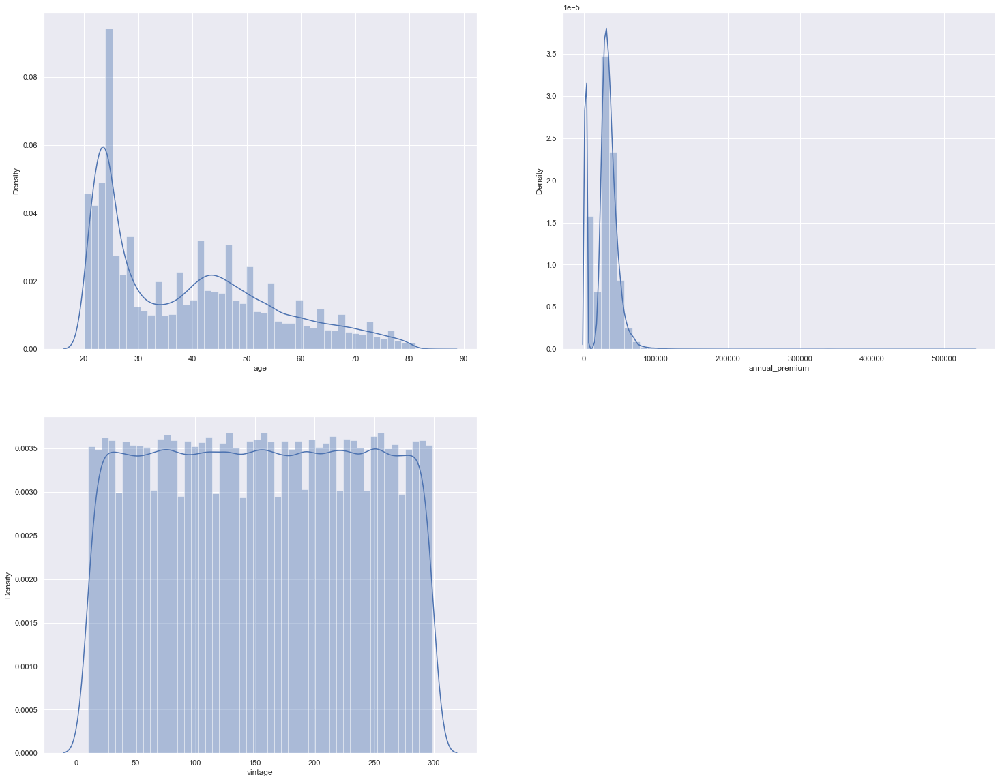

In [17]:
columns = num_att.columns.tolist()
j=1
for column in columns:
    plt.subplot(2, 2, j)
    sns.distplot(num_att[column],axlabel=column)
    j += 1

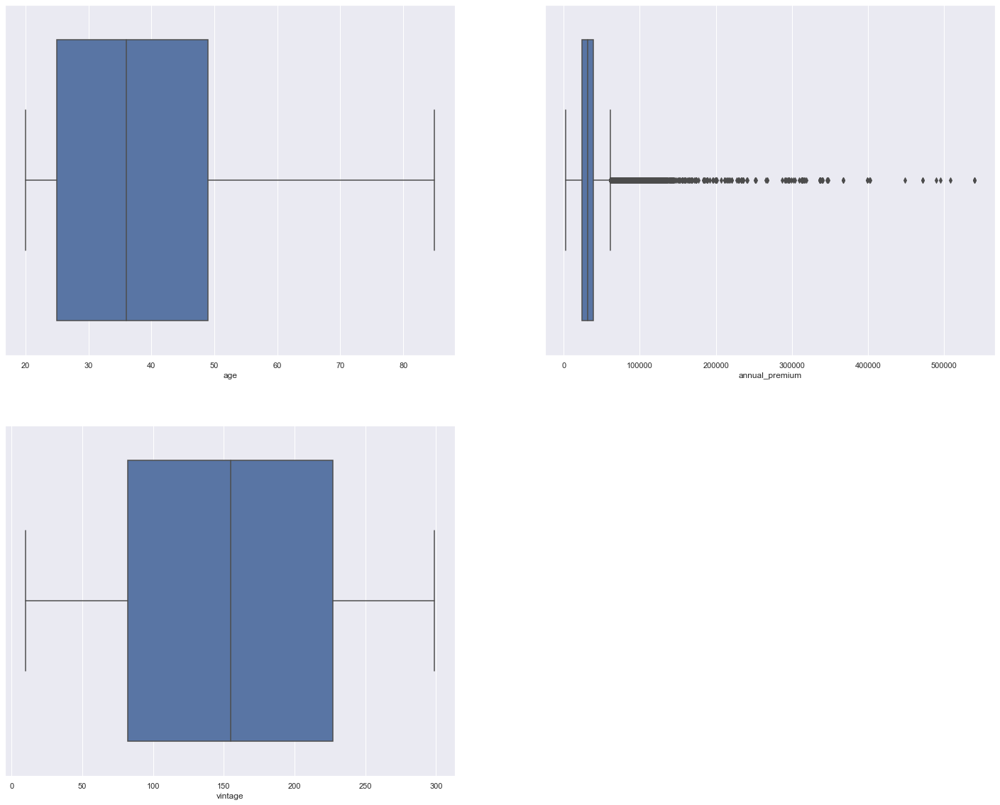

In [18]:
columns = num_att.columns.tolist()
j=1
for column in columns:
    plt.subplot(2, 2, j)
    sns.boxplot(num_att[column])
    j += 1

#### Conclusions

Age ranges from 20 to 85 years. The average age is almost 39 years and the distribution is positively skewed (0.67). There is a peak at the ages of 23 and 24, and a prevalency of customers up to 26 years.

The average of annual premium is 30,560 with a standart deviation of 17,211. The distribution is highly skewed (1.8) and has a kurtosis of 36, which implies that may be outliers and data is concentrated at the beginning of the curve (there are indeed plenty of near 0 values and the boxplot shows many outliers)

The vintage ranges from 10 to 299 days and there is low variance. Probably it will have little impact in the model.

### 2.7.2 Categorical Attributes

#### Statistics

In [19]:
cat_att.describe().T

,count,unique,top,freq
gender,285831,2,Male,154602
vehicle_age,285831,3,1-2 Year,150115
vehicle_damage,285831,2,Yes,143989
previously_insured_str,285831,2,no,154659
response_str,285831,2,no,250799
driving_license_str,285831,2,yes,285224
region_code,285831,53,28.0,79632
policy_sales_channel,285831,154,152.0,101328


#### Visualizations

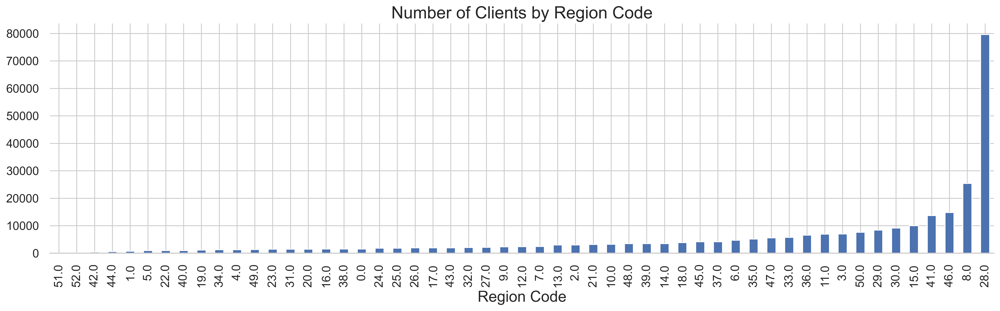

In [239]:
data = df1_train.groupby('region_code')['region_code'].count().sort_values()
data.plot.bar(figsize=(20, 5))
plt.title('Number of Clients by Region Code', size=20)
plt.xlabel('Region Code', size=18)
plt.xticks(size=14)
plt.yticks(size=14)
sns.despine(left=True)
sns.set(style="whitegrid")
plt.rcParams['figure.dpi'] = 360;

Text(0, 0.5, 'Channel')

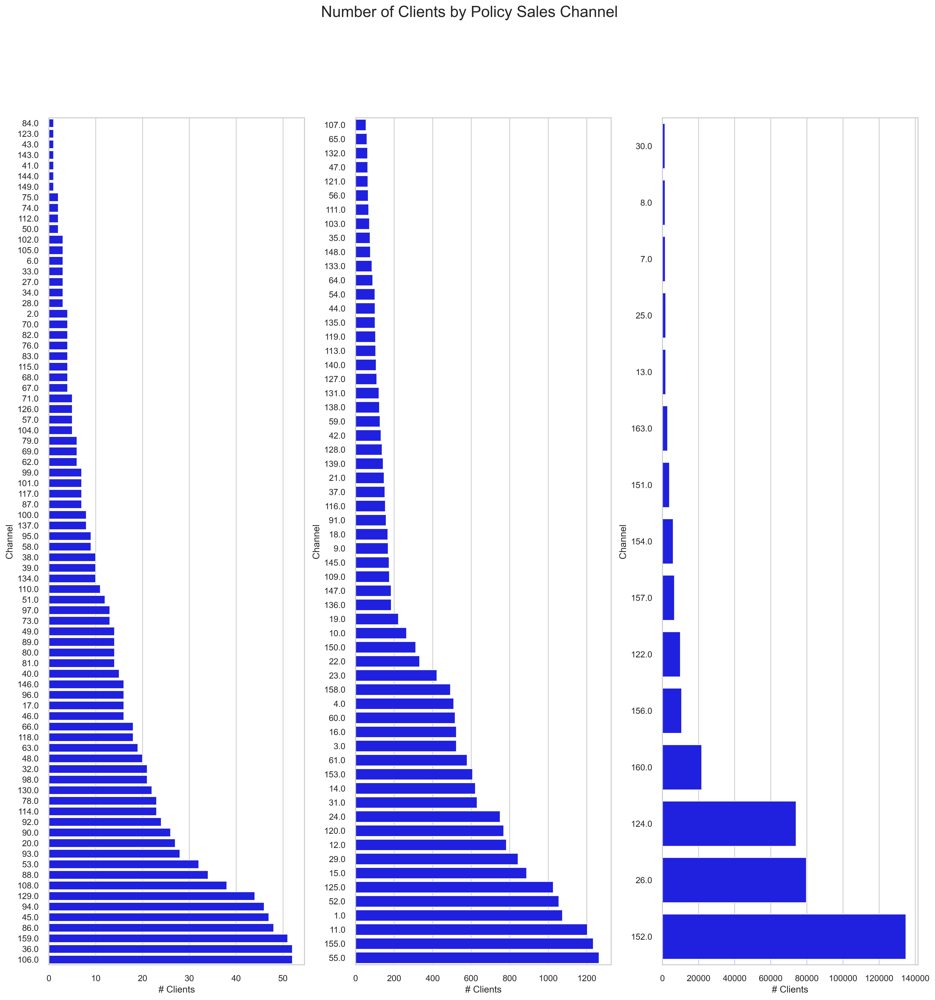

In [267]:
#colcoar order by value counts
df_policy_1 = df1['policy_sales_channel'].value_counts().sort_values().iloc[0:80]
df_policy_1 = df_policy_1.reset_index()
df_policy_2 = df1['policy_sales_channel'].value_counts().sort_values().iloc[80:140]
df_policy_2 = df_policy_2.reset_index()
df_policy_3 = df1['policy_sales_channel'].value_counts().sort_values().iloc[140:156]
df_policy_3 = df_policy_3.reset_index()

fig, axs = plt.subplots(ncols= 3, figsize = (20,20))
fig.suptitle('Number of Clients by Policy Sales Channel', size=20)
sns.barplot(y = 'index', x='policy_sales_channel', data=df_policy_1, ax=axs[0],orient = 'h',order = df_policy_1['index'], color='blue')
sns.barplot(y = 'index', x='policy_sales_channel', data=df_policy_2, ax=axs[1],orient = 'h',order = df_policy_2['index'], color='blue')
sns.barplot(y = 'index', x='policy_sales_channel', data=df_policy_3, ax=axs[2],orient = 'h',order = df_policy_3['index'], color='blue')
axs[0].set_xlabel('# Clients')
axs[0].set_ylabel('Channel')
axs[1].set_xlabel('# Clients')
axs[1].set_ylabel('Channel')
axs[2].set_xlabel('# Clients')
axs[2].set_ylabel('Channel')

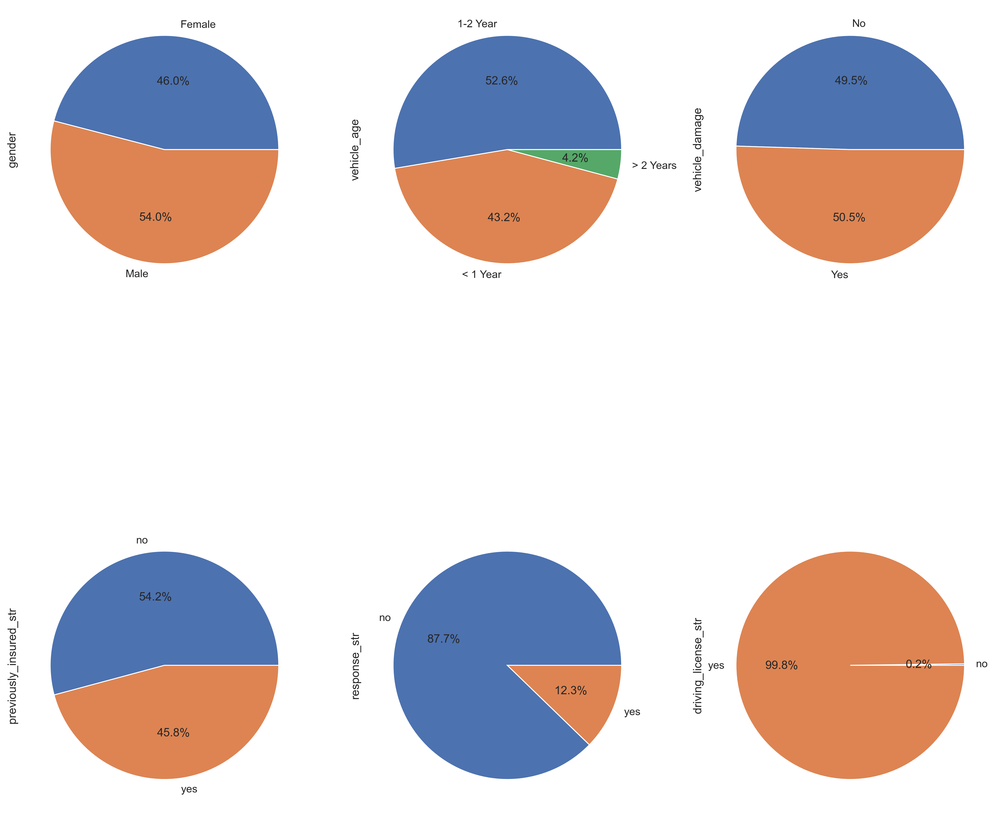

In [292]:
cat_att_pie=cat_att[['gender','vehicle_age','vehicle_damage','previously_insured_str','response_str','driving_license_str']]
columns = cat_att_pie.columns.tolist()
j=1
for column in columns:
    plt.subplot(2, 3, j)
    data = df1_train.groupby(column)[column].count()
    data.plot.pie(autopct="%.1f%%", figsize=(18, 18));
    j += 1

#### Conclusions

It doesn't look like we have any issue with the categories.

Most of clients are male (54%).

Clients with newer vehicles are the majority - vehicles with less than 2 year vehicle sums up to 95% of clients

There is balance between clients that had already suffered any vehicle damage in accepting the insurance.

Clients mostly had already had a previous insurance.

Pretty much all interested clients have a driving license. This variable may be a problem in the model and lead to overfitting.

We have plenty of policy sales channels and regions code. We don't have much information about those, so we can't try to aggregate them in order to reduce the number of variables, for example. We can see region sales 28 is where most interested clients are from, so we could ask about more information. Regarding the sales channel

Finally, our target variable is unbalanced, as almost 88% of clients do not have interest in the new insurance. However, as this seems to be intrisecal to the problem, at first, we will not balance the sample.

# 3. Feature Engineering

In [175]:
df2_train = df1_train.copy()
df2_test = df1_test.copy()

In [176]:
## Age Class
df2_train['age_class'] = df2_train['age'].apply(lambda x: 'Young Adult' if x < 35 else ('Adult' if x>=35 and x<50 else ('Middle Age' if x>=50 and x<65 else 'Old')))
df2_test['age_class'] = df2_test['age'].apply(lambda x: 'Young Adult' if x < 35 else ('Adult' if x>=35 and x<50 else ('Middle Age' if x>=50 and x<65 else 'Old')))

## Vintage Bins
df2_train['vintage_class'] = df2_train['vintage'].apply(lambda x: '1' if x < 80 else ('2' if x>=80 and x<150 else ('3' if x>=150 and x<220 else '4')))
df2_test['vintage_class'] = df2_test['vintage'].apply(lambda x: '1' if x < 80 else ('2' if x>=80 and x<150 else ('3' if x>=150 and x<220 else '4')))

## Vintage Months
df2_train['vintage_month'] = df2_train['vintage']/30
df2_test['vintage_month'] = df2_test['vintage']/30

## Vintage Weeks
df2_train['vintage_week'] = df2_train['vintage']/7
df2_test['vintage_week'] = df2_test['vintage']/7

## Anual Premium Bins
df2_train['annual_premium_bins'] = df2_train['annual_premium'].apply(lambda x: '1' if x < 13763 else ('2' if x>=13763 and x<27263 else ('3' if x>=27263 and x<40763 else '4')))
df2_test['annual_premium_bins'] = df2_test['annual_premium'].apply(lambda x: '1' if x < 13763 else ('2' if x>=13763 and x<27263 else ('3' if x>=272630 and x<40763 else '4')))

## vehicle age number
df2_train['vehicle_age_num'] = df2_train['vehicle_age'].map({'1-2 Year': 2, '< 1 Year': 1, '> 2 Years': 3})
df2_test['vehicle_age_num'] = df2_test['vehicle_age'].map({'1-2 Year': 2, '< 1 Year': 1, '> 2 Years': 3})

## vintage / customer age
df2_train['vintage_customer_age'] = df2_train['vintage'] / df2_train['age']
df2_test['vintage_customer_age'] = df2_test['vintage'] / df2_test['age']

## customer age / vehicle age
df2_train['customer_vehicle_age'] = df2_train['vehicle_age_num'] * df2_train['age']
df2_test['customer_vehicle_age'] = df2_test['vehicle_age_num'] * df2_test['age']

## anual premium / vintage
df2_train['premium_vintage'] = df2_train['annual_premium'] / df2_train['vintage']
df2_test['premium_vintage'] = df2_test['annual_premium'] / df2_test['vintage']

## anual premium / customer age
df2_train['premium_customer_age'] = df2_train['annual_premium'] / df2_train['age']
df2_test['premium_customer_age'] = df2_test['annual_premium'] / df2_test['age']

## driving licence x previously insured
df2_train['insured_licence'] = df2_train['previously_insured'] * df2_train['driving_license']
df2_test['insured_licence'] = df2_test['previously_insured'] * df2_test['driving_license']

## vehicle age x previously insured
df2_train['vehicle_age_insured'] = df2_train['vehicle_age_num'] * df2_train['previously_insured']
df2_test['vehicle_age_insured'] = df2_test['vehicle_age_num'] * df2_test['previously_insured']

## vehicle age x vehicle damaged
df2_train['vehicle_age_damaged'] = df2_train['vehicle_age_num'] * df2_train['vehicle_damage_num']
df2_test['vehicle_age_damaged'] = df2_test['vehicle_age_num'] * df2_test['vehicle_damage_num']

#logic between annual_premium divided per mean of annual_premium per region_code
df2_annual_premium_mean_region_code = df2_train.rename(columns={'annual_premium': 'annual_premium_mean'}).groupby('region_code').mean()
df2_annual_premium_mean_region_code.reset_index(inplace=True)
df2_train = df2_train.merge(df2_annual_premium_mean_region_code[['region_code', 'annual_premium_mean']], on='region_code', how='left')
df2_train['annual_premium_per_ap_mean_rc'] = df2_train.apply(lambda row: (row['annual_premium']/row['annual_premium_mean']) ,axis=1)
df2_train.drop(columns='annual_premium_mean', inplace = True)
df2_annual_premium_mean_region_code = None

#logic between annual_premium divided per mean of annual_premium per policy_sales_channel
df2_annual_premium_mean_policy_sales_channel = df2_train.rename(columns={'annual_premium': 'annual_premium_mean'}).groupby('policy_sales_channel').mean()
df2_annual_premium_mean_policy_sales_channel.reset_index(inplace=True)
df2_train = df2_train.merge(df2_annual_premium_mean_policy_sales_channel[['policy_sales_channel', 'annual_premium_mean']], on='policy_sales_channel', how='left')
df2_train['annual_premium_per_ap_mean_psc'] = df2_train.apply(lambda row: (row['annual_premium']/row['annual_premium_mean']) ,axis=1)
df2_train.drop(columns='annual_premium_mean', inplace = True)
df2_annual_premium_mean_policy_sales_channel = None

# age vintage
df2_train['age_vintage'] = (df2_train['age']*365) / (df2_train['vintage'])
df2_test['age_vintage'] = (df2_test['age']*365) / (df2_test['vintage'])

In [177]:
df2_train.dtypes

id_cust                           int64  
gender                            object 
age                               int64  
region_code                       object 
policy_sales_channel              object 
driving_license                   int64  
vehicle_age                       object 
vehicle_damage                    object 
previously_insured                int64  
annual_premium                    float64
vintage                           int64  
response                          int64  
previously_insured_str            object 
response_str                      object 
driving_license_str               object 
vehicle_damage_num                int64  
age_class                         object 
vintage_class                     object 
vintage_month                     float64
vintage_week                      float64
annual_premium_bins               object 
vehicle_age_num                   int64  
vintage_customer_age              float64
customer_vehicle_age              

In [178]:
df2_train['insured_licence'] = df2_train['insured_licence'].astype('str')
df2_test['insured_licence'] = df2_test['insured_licence'].astype('str')

df2_train['vehicle_age_insured'] = df2_train['vehicle_age_insured'].astype('str')
df2_test['vehicle_age_insured'] = df2_test['vehicle_age_insured'].astype('str')

df2_train['vehicle_age_damaged'] = df2_train['vehicle_age_damaged'].astype('str')
df2_test['vehicle_age_damaged'] = df2_test['vehicle_age_damaged'].astype('str')

# 4. Exploratory Data Analysis

In [293]:
df3_train = df2_train.copy()
df3_test = df2_test.copy()

## 4.1 Target Variable

As we noted previously, the target variable is unbalanced.

In [28]:
df3_train['response_str'].value_counts(normalize=True)*100

no    87.743807
yes   12.256193
Name: response_str, dtype: float64

<AxesSubplot:ylabel='response_str'>

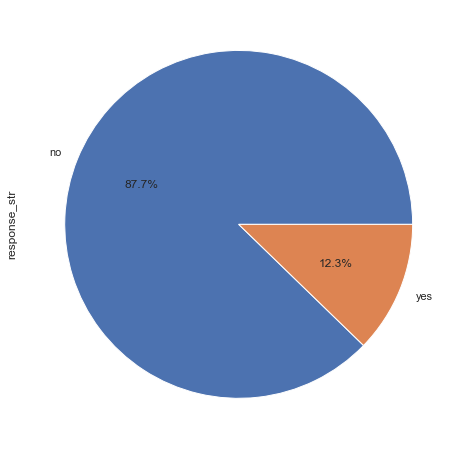

In [29]:
data = df1_train.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8));

## 4.2 Univariate Analysis

In [294]:
num_att = df3_train[['age','annual_premium','vintage','vintage_month','vintage_week','vintage_customer_age','customer_vehicle_age','premium_vintage','premium_customer_age','annual_premium_per_ap_mean_rc','annual_premium_per_ap_mean_psc','age_vintage']]
cat_att = df3_train[['gender','region_code','policy_sales_channel','vehicle_age','vehicle_damage','previously_insured_str','driving_license_str','age_class','vintage_class','annual_premium_bins','insured_licence','vehicle_age_insured','vehicle_age_damaged']]

### 4.2.1 Numerical Variables

In [296]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']
columns = num_att.columns.tolist()
j=1

for column in columns:
    plt.rcParams['figure.figsize'] = [25, 75]
    plt.subplot(11, 2, j)
    sns.distplot(num_yes[column], color='orange', kde=True, label='Interested')
    sns.distplot(num_no[column], kde=True, label='Not interested')
    plt.title(column);
    plt.xticks(size=14)
    plt.yticks(size=14)
    sns.despine(left=True)
    sns.set(style="whitegrid")
    plt.legend()
    j += 1


This initial analysis allows us to visualize some trends. For example, between 30 and 60 years old, there are more interested clients. The created variables vintage_customer_age and customer_vehicle_age may add a little more information about interested clients, if they are not too correlated with the age feature.

The other features alone do not seem to add much information to the model as the distributions between interested and not interested clients are very similar.



### 4.2.2 Categorical Variables

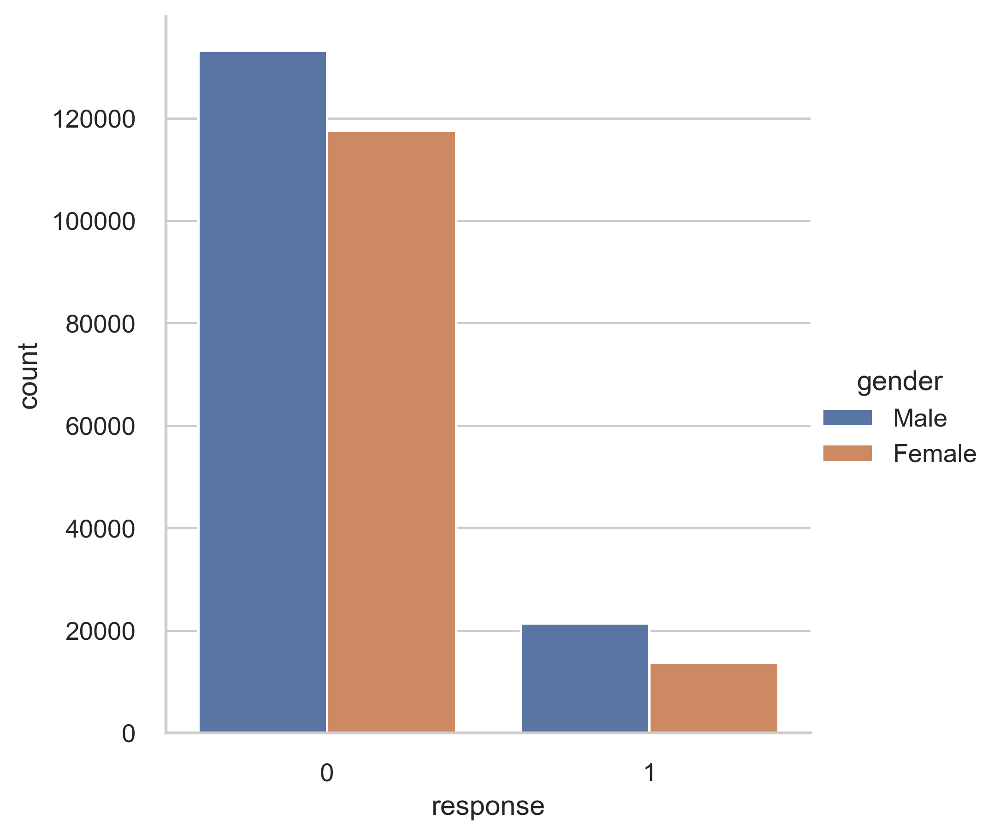

In [297]:
sns.catplot(x="response", kind="count", hue="gender", data=df3_train)
sns.set(style="whitegrid");

In [33]:
pd.crosstab(df3_train['gender'], df3_train['response'],normalize='index').round(4)*100

response,0,1
gender,,
Female,89.600000,10.400000
Male,86.170000,13.830000


In [34]:
pd.crosstab(df3_train['response'], df3_train['gender'],normalize='index').round(4)*100

gender,Female,Male
response,,
0,46.880000,53.120000
1,38.970000,61.030000


Conclusion: 

In gross values, most of our clients are male and most of the interested customers are male. When we analyse the percentage of each group that is interested, we have similar values - 10% for female, 14% for male.


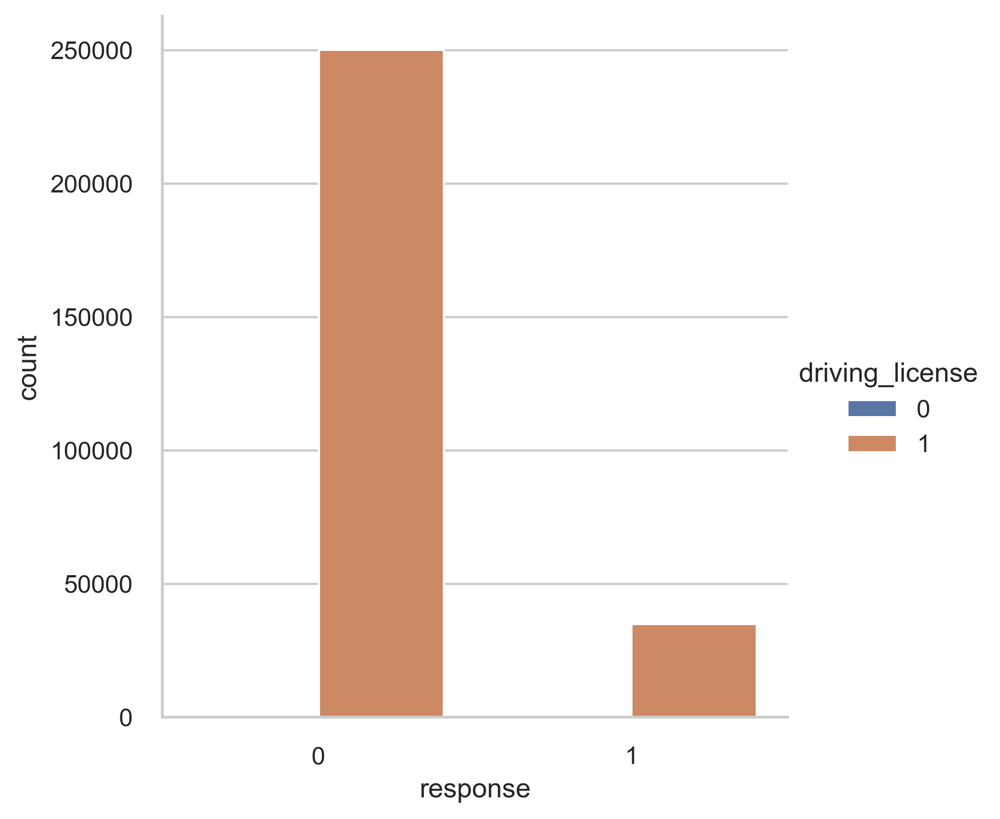

In [298]:
sns.catplot(x="response", kind="count", hue="driving_license", data=df3_train)
sns.set(style="whitegrid");

In [36]:
pd.crosstab(df3_train['driving_license'], df3_train['response'],normalize='index').round(4)*100

response,0,1
driving_license,,
0,95.220000,4.780000
1,87.730000,12.270000


In [37]:
pd.crosstab(df3_train['response'], df3_train['driving_license'],normalize='index').round(4)*100

driving_license,0,1
response,,
0,0.230000,99.770000
1,0.080000,99.920000


Conclusion:

As we had seem before, almost all of our clients do have a driving licence and about 12% of them are interested in the new insurance.



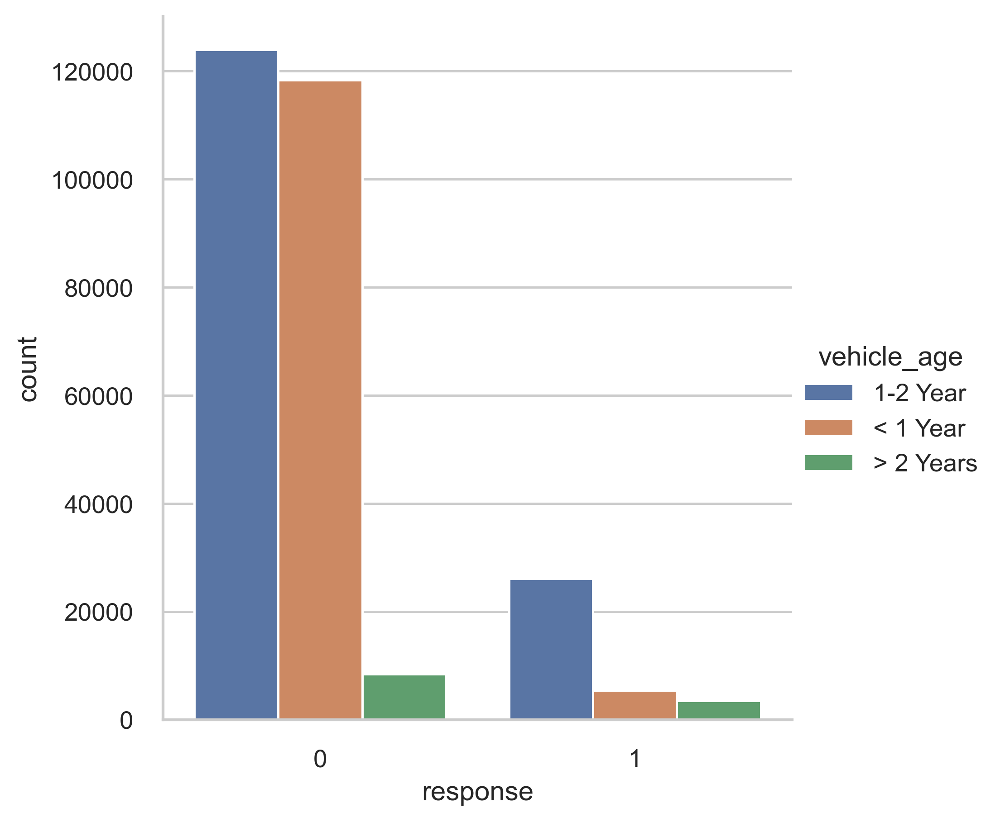

In [299]:
sns.catplot(x="response", kind="count", hue="vehicle_age", data=df3_train)
sns.set(style="whitegrid");

In [39]:
pd.crosstab(df3_train['vehicle_age'], df3_train['response'],normalize='index').round(4)*100

response,0,1
vehicle_age,,
1-2 Year,82.610000,17.390000
< 1 Year,95.630000,4.370000
> 2 Years,70.600000,29.400000


In [40]:
pd.crosstab(df1_train['response'], df1_train['vehicle_age'],normalize='index').round(4)*100

vehicle_age,1-2 Year,< 1 Year,> 2 Years
response,,,
0,49.440000,47.200000,3.360000
1,74.530000,15.450000,10.020000


Conclusion: Most clients have clients with vehicles up to 2 years. When considering the percentage of interested customers by vehicle age are:

< 1 year: 17%

1-2 year: 4%

\> 2 years: 29%

This can be an useful feature for our model as clients with older vehicles seem to be more interested in the insurance. Also, clients with very new vehicles show more interest than "middle" age vehicles.



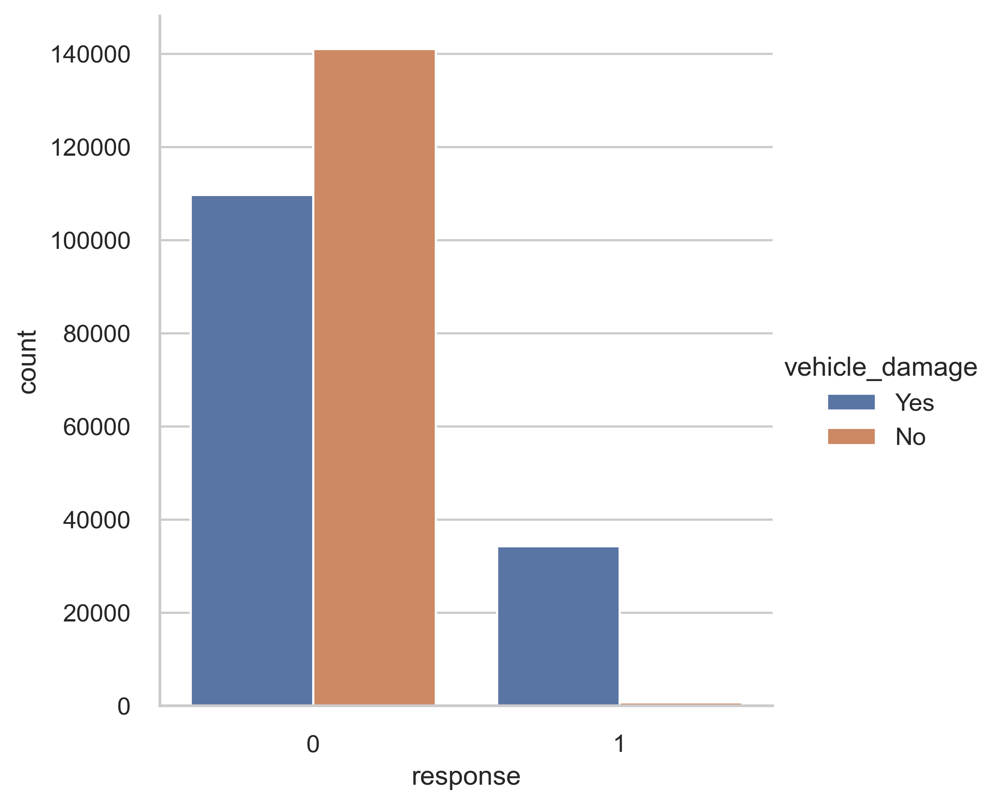

In [300]:
sns.catplot(x="response", kind="count", hue="vehicle_damage", data=df3_train)
sns.set(style="whitegrid");

In [42]:
pd.crosstab(df3_train['vehicle_damage'], df3_train['response'],normalize='index').round(4)*100

response,0,1
vehicle_damage,,
No,99.460000,0.540000
Yes,76.200000,23.800000


In [43]:
pd.crosstab(df3_train['response'], df3_train['vehicle_damage'],normalize='index').round(4)*100

vehicle_damage,No,Yes
response,,
0,56.250000,43.750000
1,2.170000,97.830000


Conclusion: We have some balance between clients with and without any previous vehicle damage, but most of clients experienced this. Among clients that had any previous vehicle damage, 23% of them are interested in the insurance, and less than 1% of clients that did not had damages are interest.



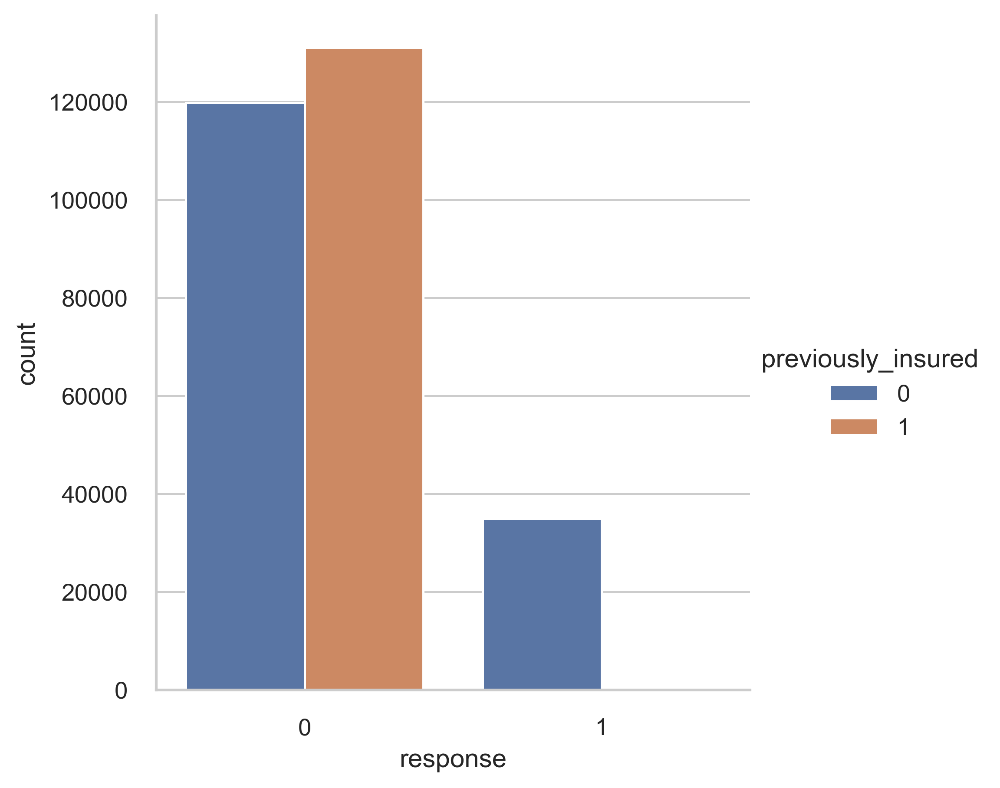

In [301]:
sns.catplot(x="response", kind="count", hue="previously_insured", data=df3_train)
sns.set(style="whitegrid");

In [45]:
pd.crosstab(df3_train['previously_insured'], df3_train['response'],normalize='index').round(4)*100

response,0,1
previously_insured,,
0,77.430000,22.570000
1,99.910000,0.090000


In [46]:
pd.crosstab(df1_train['response'], df3_train['previously_insured'],normalize='index').round(4)*100

previously_insured,0,1
response,,
0,54.290000,45.710000
1,53.400000,46.600000


Conclusion: 22% of clients that weren't previouly insured are interested in the buying the new insurance. However, less than 1% of previously insured clients are interested. This feature can be an interesting or it can be biasing our model, we should verify if clients with previous insurance are still being insured so it doesn't make sense to buy another insurance.



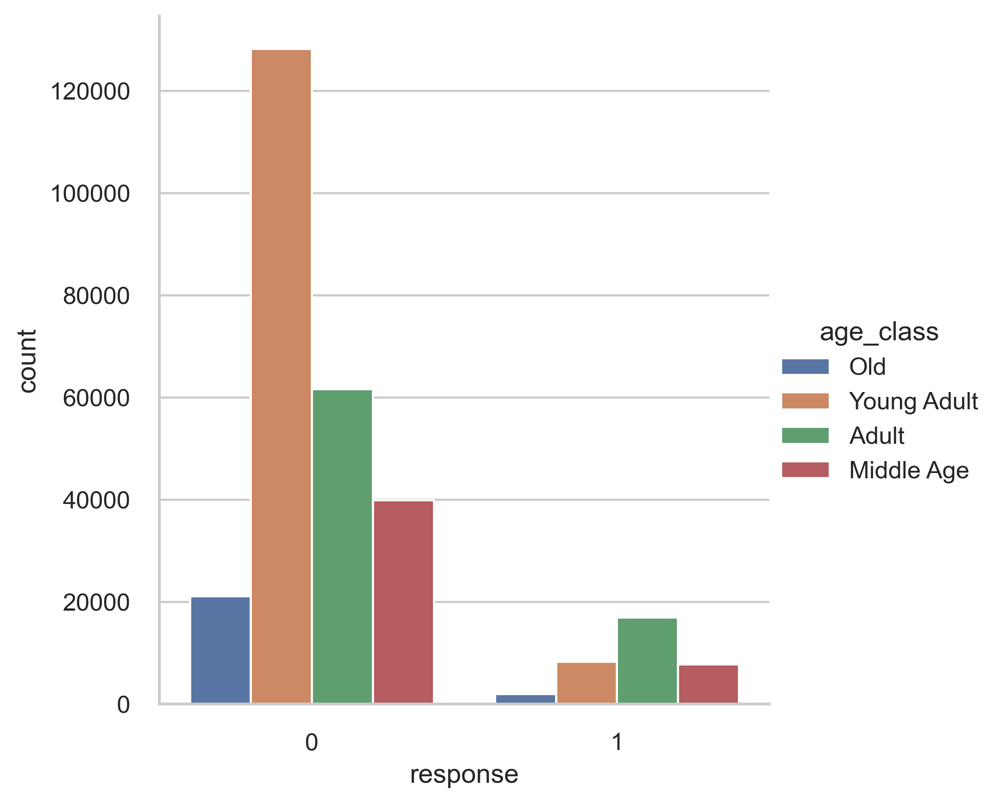

In [302]:
sns.catplot(x="response", kind="count", hue="age_class", data=df3_train)
sns.set(style="whitegrid");

In [48]:
pd.crosstab(df3_train['age_class'], df3_train['response'],normalize='index').round(4)*100

response,0,1
age_class,,
Adult,78.440000,21.560000
Middle Age,83.620000,16.380000
Old,91.420000,8.580000
Young Adult,93.910000,6.090000


In [49]:
pd.crosstab(df3_train['response'], df3_train['age_class'],normalize='index').round(4)*100

age_class,Adult,Middle Age,Old,Young Adult
response,,,,
0,24.560000,15.920000,8.400000,51.120000
1,48.310000,22.330000,5.650000,23.720000


Conclusion: Most of our clients are in the Young Adult phase, followed by Adults. 21% of Adults and 16% of YA are interested in the insurance and are the groups we should focus.

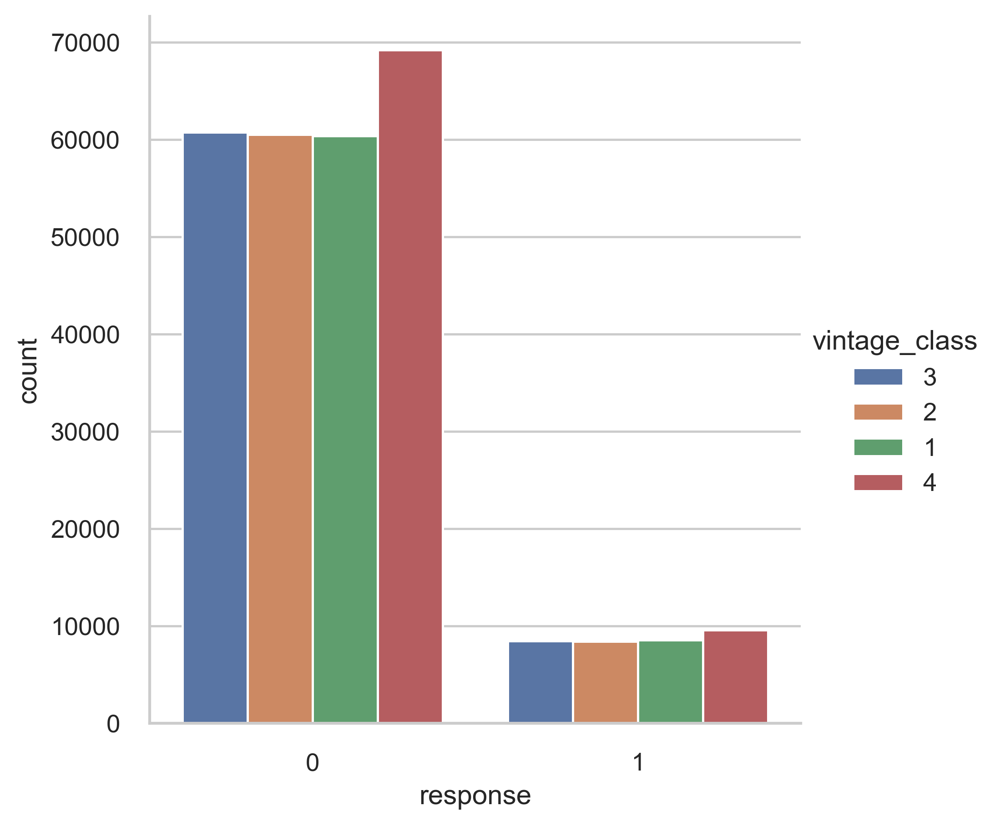

In [303]:
sns.catplot(x="response", kind="count", hue="vintage_class", data=df3_train)
sns.set(style="whitegrid");

In [51]:
pd.crosstab(df3_train['vintage_class'], df3_train['response'],normalize='index').round(4)*100

response,0,1
vintage_class,,
1,87.610000,12.390000
2,87.790000,12.210000
3,87.750000,12.250000
4,87.820000,12.180000


In [52]:
pd.crosstab(df3_train['response'], df3_train['vintage_class'],normalize='index').round(4)*100

vintage_class,1,2,3,4
response,,,,
0,24.060000,24.130000,24.220000,27.590000
1,24.370000,24.040000,24.200000,27.400000


Conclusion: As we have seen in the distribution, there is little variance in the interest of clients when we consider vintage. Not an useful variable


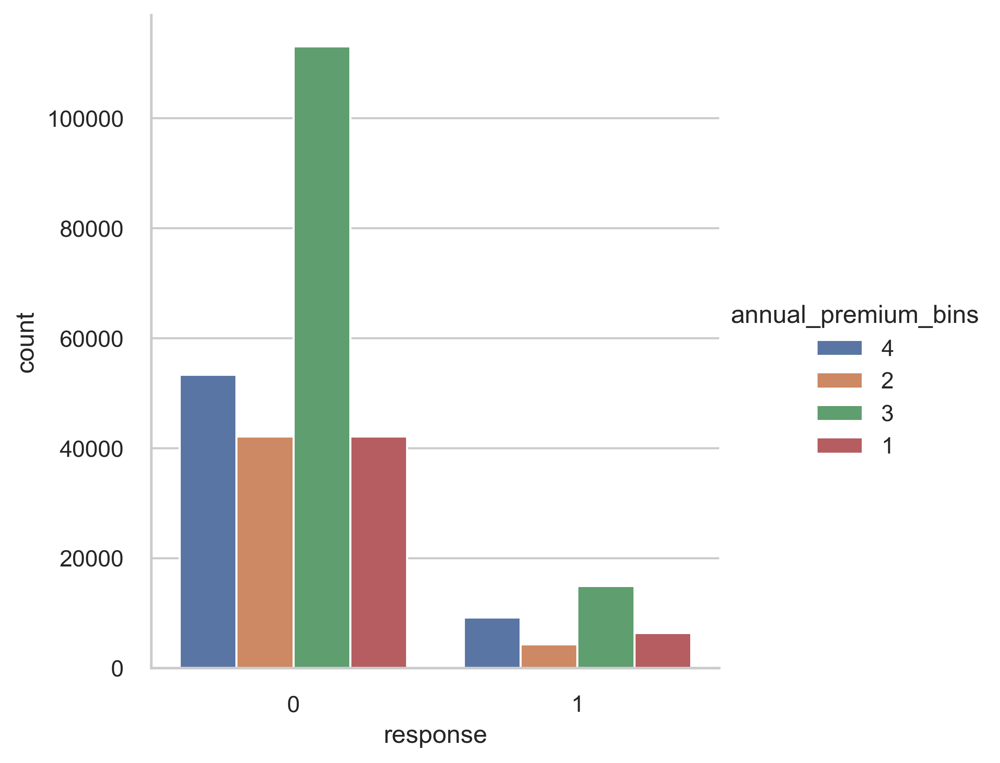

In [304]:
sns.catplot(x="response", kind="count", hue="annual_premium_bins", data=df3_train)
sns.set(style="whitegrid");

In [181]:
pd.crosstab(df3_train['annual_premium_bins'], df3_train['response'],normalize='index').round(4)*100

response,0,1
annual_premium_bins,,
1,86.850000,13.150000
2,90.570000,9.430000
3,88.290000,11.710000
4,85.210000,14.790000


In [182]:
pd.crosstab(df3_train['response'], df3_train['annual_premium_bins'],normalize='index').round(4)*100

annual_premium_bins,1,2,3,4
response,,,,
0,16.820000,16.790000,45.100000,21.290000
1,18.230000,12.520000,42.800000,26.440000


****** rever bins 50% pra cima/baixo e divide por 2?

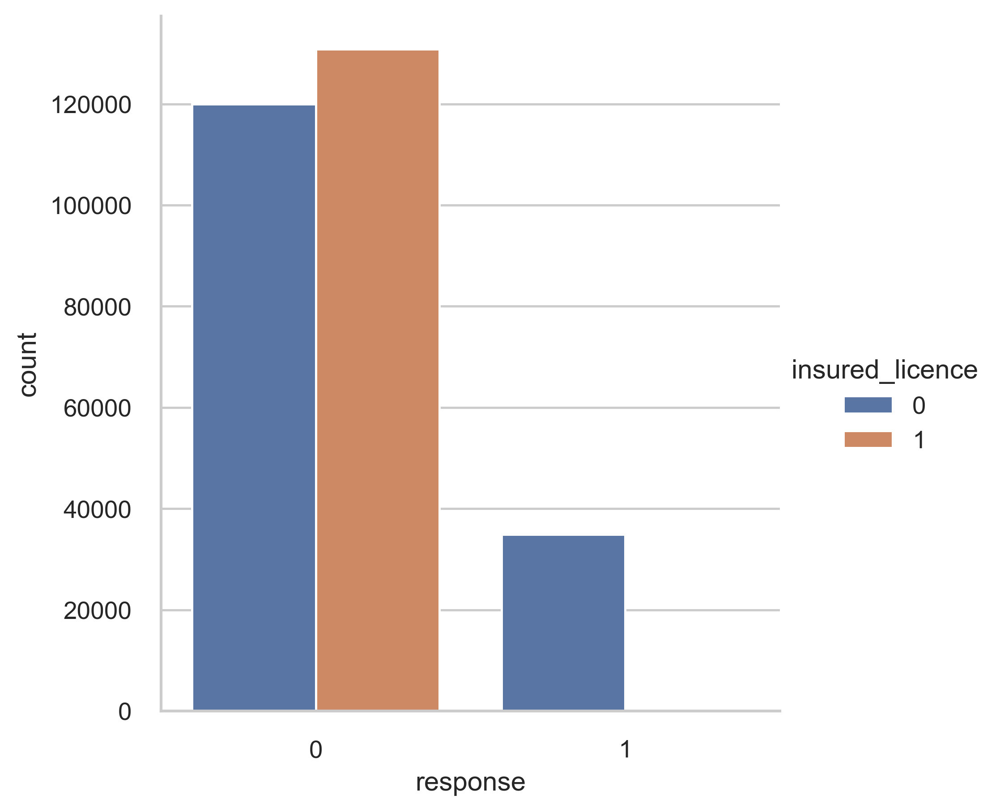

In [305]:
sns.catplot(x="response", kind="count", hue="insured_licence", data=df3_train)
sns.set(style="whitegrid");

In [57]:
pd.crosstab(df3_train['insured_licence'], df3_train['response'],normalize='index').round(4)*100

response,0,1
insured_licence,,
0,77.450000,22.550000
1,99.910000,0.090000


In [58]:
pd.crosstab(df3_train['response'], df3_train['insured_licence'],normalize='index').round(4)*100

insured_licence,0,1
response,,
0,47.820000,52.180000
1,99.660000,0.340000


Conclusion: Not useful



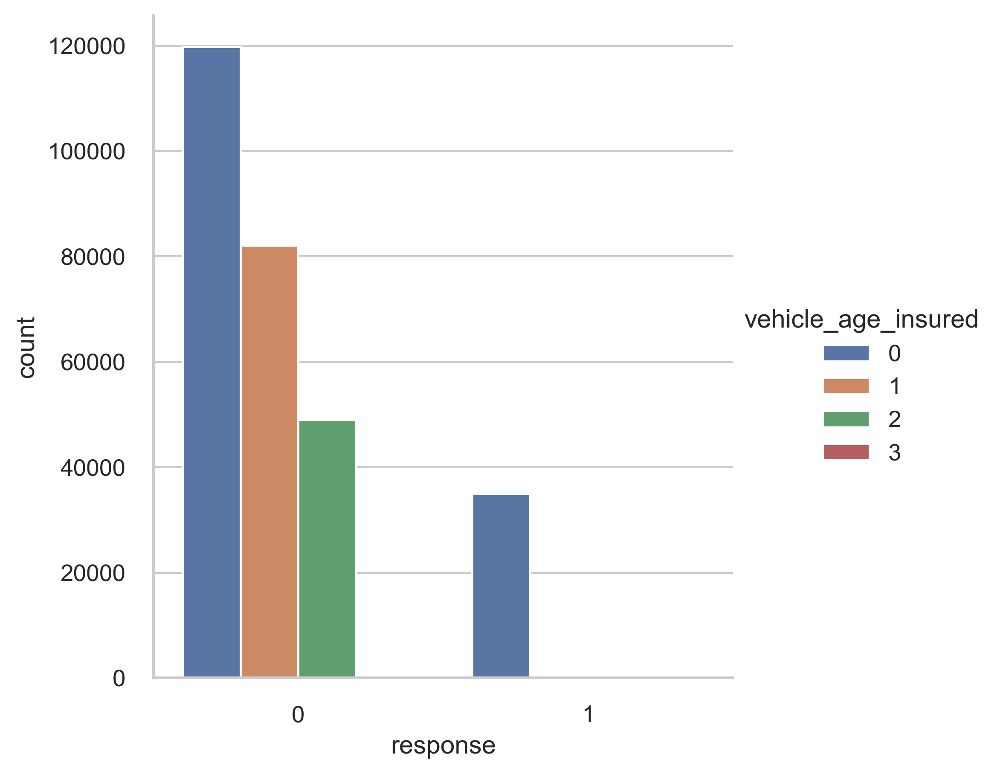

In [306]:
sns.catplot(x="response", kind="count", hue="vehicle_age_insured", data=df3_train)
sns.set(style="whitegrid");

In [60]:
pd.crosstab(df3_train['vehicle_age_insured'], df3_train['response'],normalize='index').round(4)*100

response,0,1
vehicle_age_insured,,
0,77.430000,22.570000
1,99.940000,0.060000
2,99.860000,0.140000
3,97.220000,2.780000


In [61]:
pd.crosstab(df3_train['response'], df3_train['vehicle_age_insured'],normalize='index').round(4)*100

vehicle_age_insured,0,1,2,3
response,,,,
0,47.750000,32.730000,19.520000,0.010000
1,99.660000,0.130000,0.200000,0.000000


Conclusion: Not useful

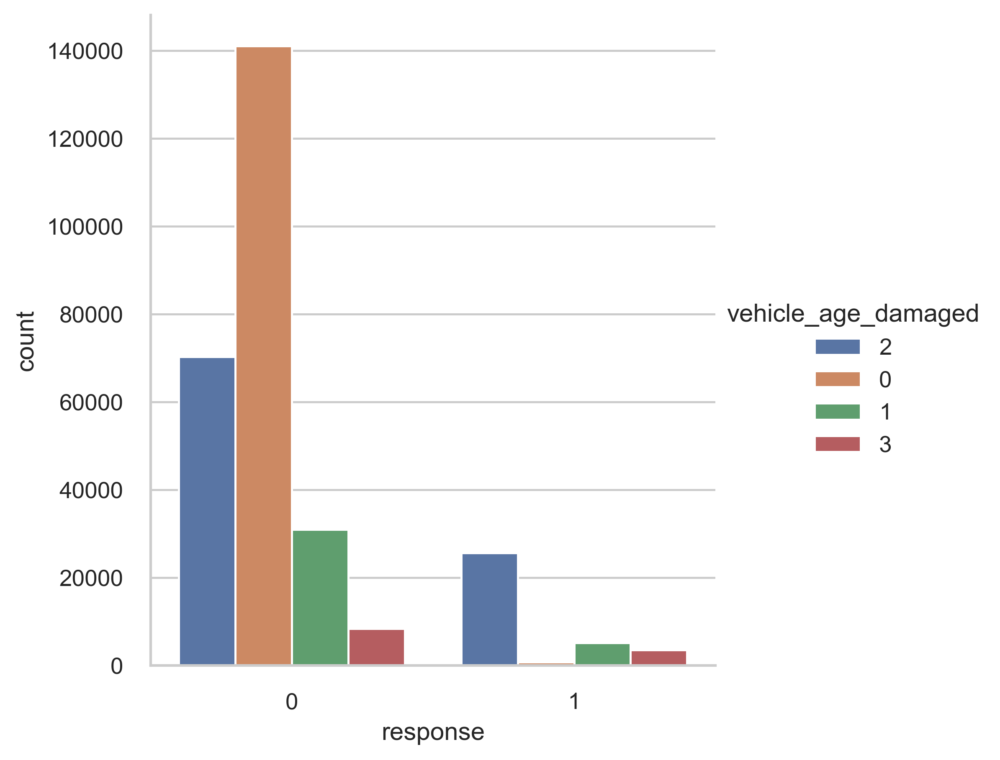

In [307]:
sns.catplot(x="response", kind="count", hue="vehicle_age_damaged", data=df3_train)
sns.set(style="whitegrid");

In [63]:
pd.crosstab(df3_train['vehicle_age_damaged'], df3_train['response'],normalize='index').round(4)*100

response,0,1
vehicle_age_damaged,,
0,99.460000,0.540000
1,85.840000,14.160000
2,73.270000,26.730000
3,70.570000,29.430000


In [64]:
pd.crosstab(df3_train['response'], df3_train['vehicle_age_damaged'],normalize='index').round(4)*100

vehicle_age_damaged,0,1,2,3
response,,,,
0,56.250000,12.350000,28.040000,3.350000
1,2.170000,14.590000,73.220000,10.020000


Conclusion: If not correlated to the age feature, this variable may be useful

## 4.3 Bivariate Analysis - Hypothesis

### H1 - Age impacts the decision to keep a car insurance: True

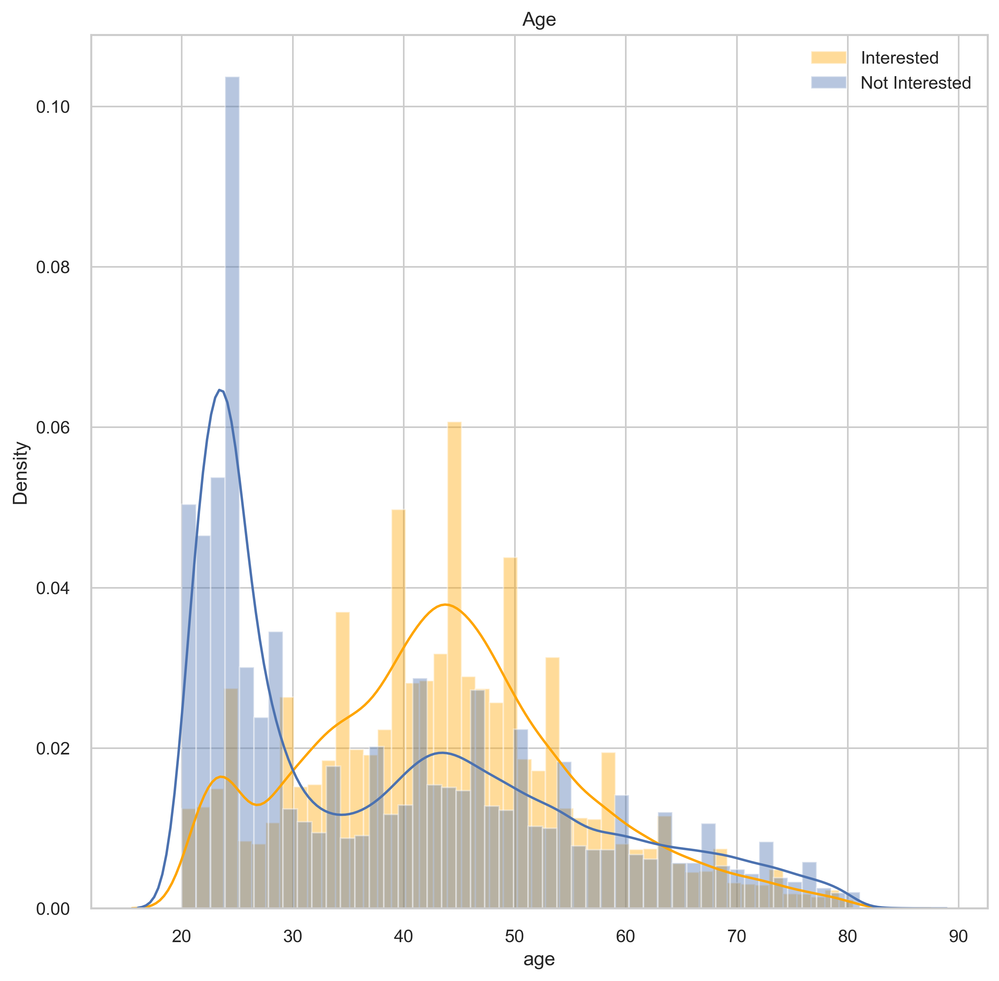

In [310]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']

plt.rcParams['figure.figsize'] = [10, 10]
sns.distplot(num_yes['age'], color='orange', kde=True, label='Interested')
sns.distplot(num_no['age'], kde=True, label='Not Interested')
plt.title('Age')
plt.legend()
sns.set(style="whitegrid");

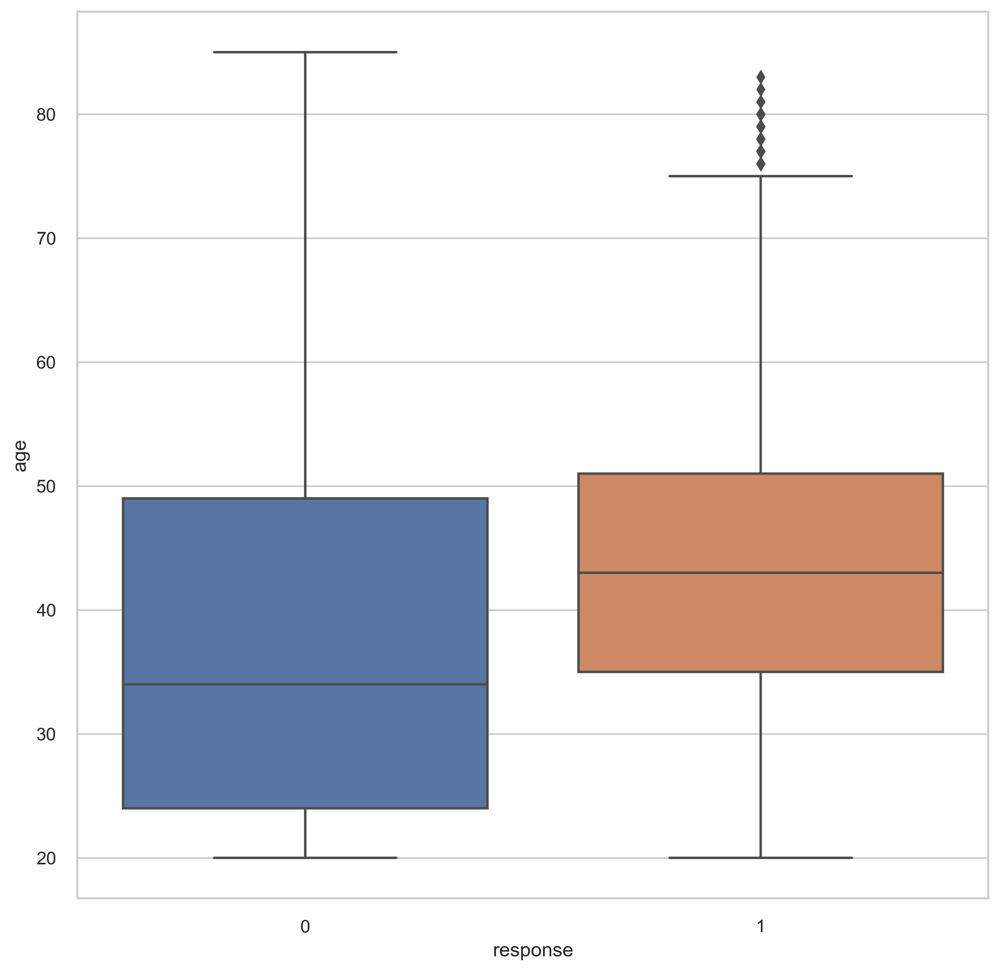

In [309]:
plt.rcParams['figure.figsize'] = [10, 10]
sns.boxplot(x= 'response', y='age', data=df3_train)
sns.set(style="whitegrid"); 

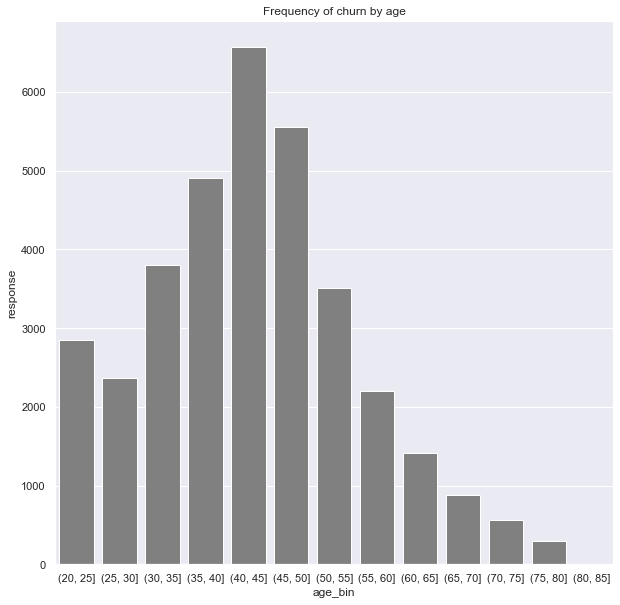

In [67]:
aux1 = df3_train[df3_train['response'] == 1 ][['response', 'age']].groupby(['age']).sum().reset_index()
bins = list( np.arange( 20, 90, 5) )
aux2 = aux1
aux2['age_bin'] = pd.cut(aux1['age'], bins=bins)
aux3 = aux2[['response', 'age_bin']].groupby(['age_bin']).sum().reset_index()
sns.barplot(x='age_bin', y='response', data=aux3, color='grey')
plt.title('Frequency of churn by age');

### H2 - Gender impacts the decision to keep a car insurance: True

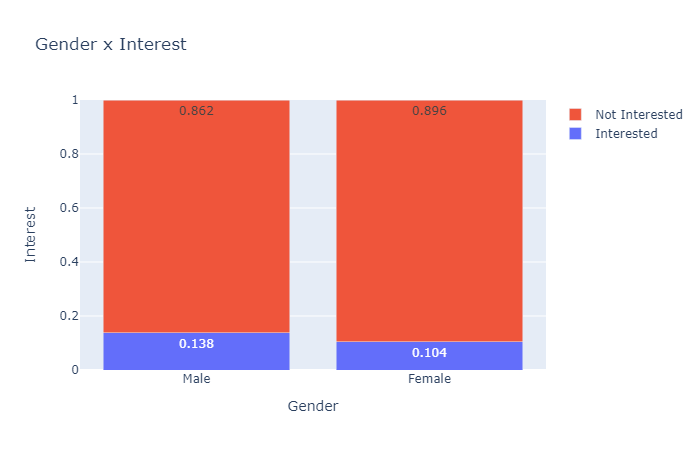

In [312]:
import plotly.graph_objects as go

data3a = dict(type='bar',
         x=df3_train['gender'],
         y=df3_train[df3_train['response_str']=='yes']['gender'].value_counts(),
         name='Interested',
         text=round(df3_train[df3_train['response_str']=='yes']['gender'].value_counts()/df3_train['gender'].value_counts(),3),
            textposition='auto',
                    )

data3b = dict(type='bar',
         x=df3_train['gender'],
         y=df3_train[df3_train['response_str']=='no']['gender'].value_counts(),
         name='Not Interested',
              text=round(df3_train[df3_train['response_str']=='no']['gender'].value_counts()/df3_train['gender'].value_counts(),3),
            textposition='auto',
               )

data3=[data3a, data3b]

layout3= dict(title=dict(text='Gender x Interest'),
                 yaxis=dict(title='Interest'),
                 xaxis=dict(title='Gender'),
                barmode='stack',
               barnorm='fraction'
                )

fig3=go.Figure(data=data3, layout=layout3)
fig3.show(renderer='png')

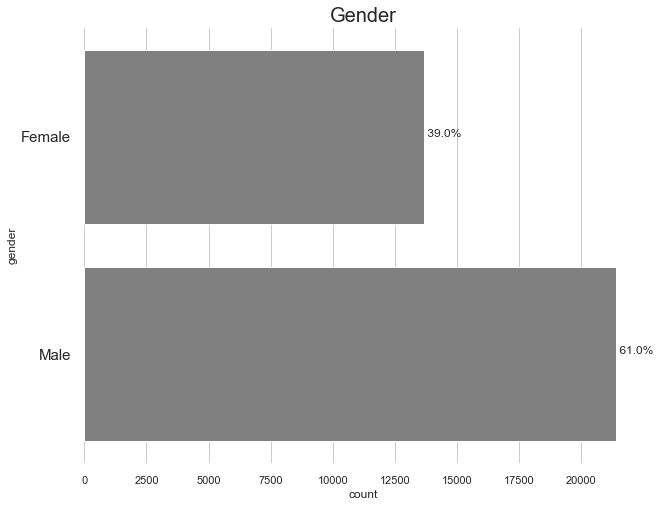

In [223]:
plt.figure(figsize(10,8))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='gender', data=aux1, color='grey')
sns.set_style('whitegrid')
plt.title('Gender', size =20)
plt.yticks(np.arange(2), ['Female', 'Male'], size = 15)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H3 - Car age impacts the decision to keep a car insurance: True

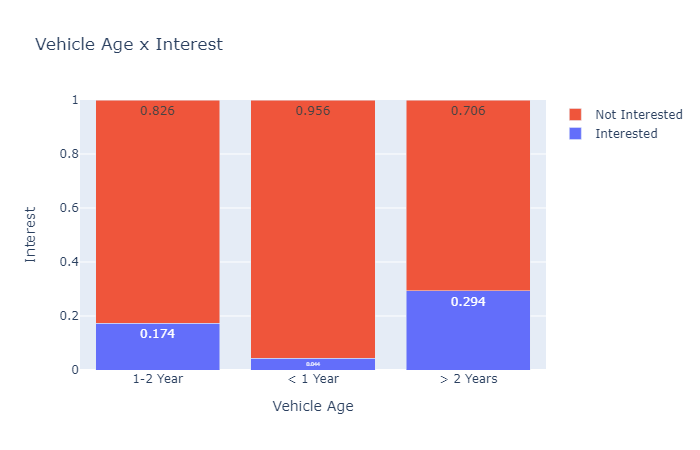

In [313]:
data3a = dict(type='bar',
         x=df3_train['vehicle_age'].unique(),
         y=df3_train[df3_train['response_str']=='yes']['vehicle_age'].value_counts(),
         name='Interested',
         text=round(df3_train[df3_train['response_str']=='yes']['vehicle_age'].value_counts()/df3_train['vehicle_age'].value_counts(),3),
            textposition='auto',
                    )

data3b = dict(type='bar',
         x=df3_train['vehicle_age'].unique(),
         y=df3_train[df3_train['response_str']=='no']['vehicle_age'].value_counts(),
         name='Not Interested',
              text=round(df3_train[df3_train['response_str']=='no']['vehicle_age'].value_counts()/df3_train['vehicle_age'].value_counts(),3),
            textposition='auto',
               )


data3=[data3a, data3b]

layout3= dict(title=dict(text='Vehicle Age x Interest'),
                 yaxis=dict(title='Interest'),
                 xaxis=dict(title='Vehicle Age'),
                barmode='stack',
               barnorm='fraction'
                )

fig3=go.Figure(data=data3, layout=layout3)
fig3.show(renderer='png')

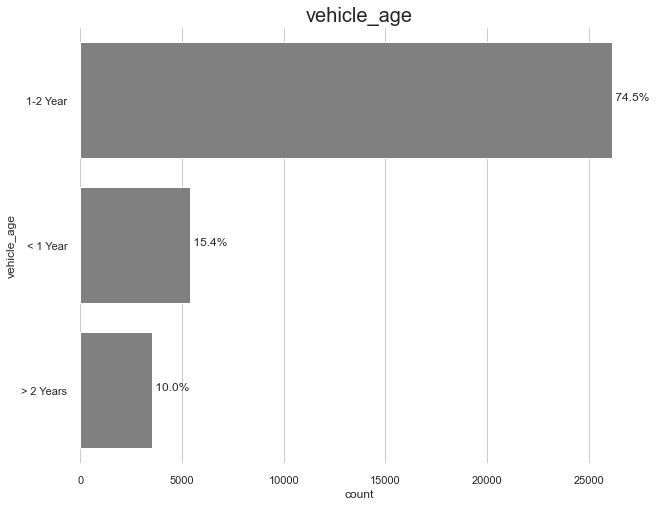

In [222]:
plt.figure(figsize(10,8))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='vehicle_age', data=aux1, color='grey')
plt.title('vehicle_age', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H4 - Customers previously insured are more likely to buy the car insurance: False

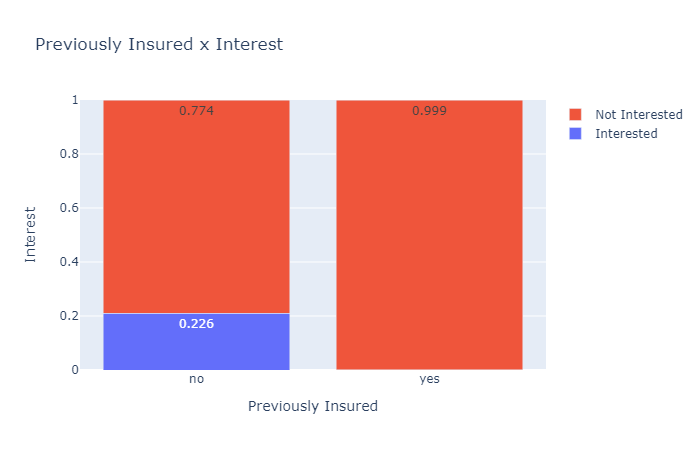

In [314]:
data3a = dict(type='bar',
         x=df3_train['previously_insured_str'].unique(),
         y=df3_train[df3_train['response_str']=='yes']['previously_insured_str'].value_counts(),
         name='Interested',
         text=round(df3_train[df3_train['response_str']=='yes']['previously_insured_str'].value_counts()/df3_train['previously_insured_str'].value_counts(),3),
            textposition='auto',
                    )

data3b = dict(type='bar',
         x=df3_train['previously_insured_str'].unique(),
         y=df3_train[df3_train['response_str']=='no']['previously_insured_str'].value_counts(),
         name='Not Interested',
              text=round(df3_train[df3_train['response_str']=='no']['previously_insured_str'].value_counts()/df3_train['previously_insured_str'].value_counts(),3),
            textposition='auto',
               )


data3=[data3a, data3b]

layout3= dict(title=dict(text='Previously Insured x Interest'),
                 yaxis=dict(title='Interest'),
                 xaxis=dict(title='Previously Insured'),
                barmode='stack',
               barnorm='fraction'
                )

fig3=go.Figure(data=data3, layout=layout3)
fig3.show(renderer='png')

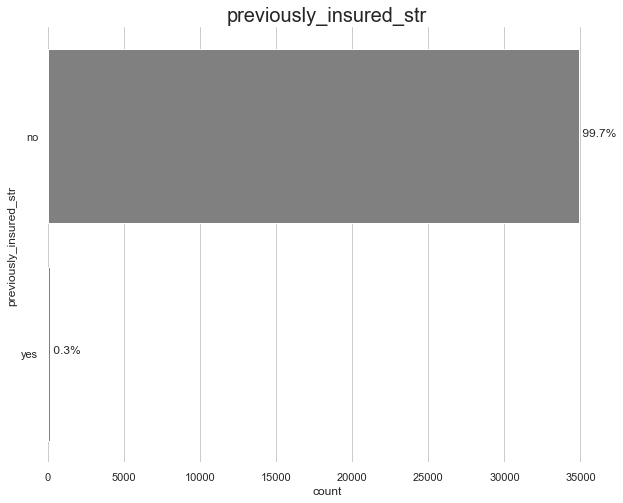

In [73]:
plt.figure(figsize(10,8))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='previously_insured_str', data=aux1, color='grey')
plt.title('previously_insured_str', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H5 - Customers with previously damaged cars are more likely buy the car insurance: True, but be careful

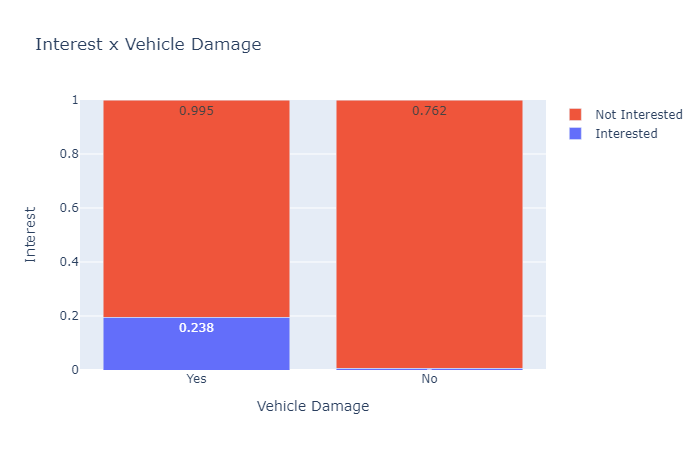

In [318]:
data3a = dict(type='bar',
         x=df3_train['vehicle_damage'].unique(),
         y=df3_train[df3_train['response_str']=='yes']['vehicle_damage'].value_counts(),
         name='Interested',
         text=round(df3_train[df3_train['response_str']=='yes']['vehicle_damage'].value_counts()/df3_train['vehicle_damage'].value_counts(),3),
            textposition='auto',
                    )

data3b = dict(type='bar',
         x=df3_train['vehicle_damage'].unique(),
         y=df3_train[df3_train['response_str']=='no']['vehicle_damage'].value_counts(),
         name='Not Interested',
              text=round(df3_train[df3_train['response_str']=='no']['vehicle_damage'].value_counts()/df3_train['vehicle_damage'].value_counts(),3),
            textposition='auto',
               )


data3=[data3a, data3b]

layout3= dict(title=dict(text='Interest x Vehicle Damage'),
                 yaxis=dict(title='Interest'),
                 xaxis=dict(title='Vehicle Damage'),
                barmode='stack',
               barnorm='fraction'
                )

fig3=go.Figure(data=data3, layout=layout3)
fig3.show(renderer='png')

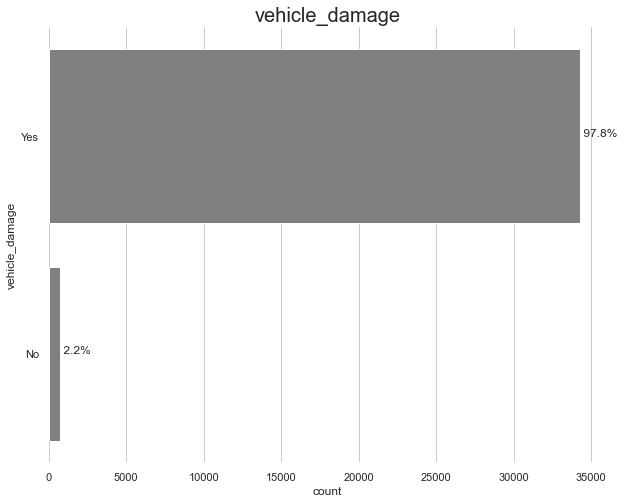

In [75]:
plt.figure(figsize(10,8))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='vehicle_damage', data=aux1, color='grey')
plt.title('vehicle_damage', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H6 - Customers with higher annual premium are more likely buy a car insurance: Somewhat true

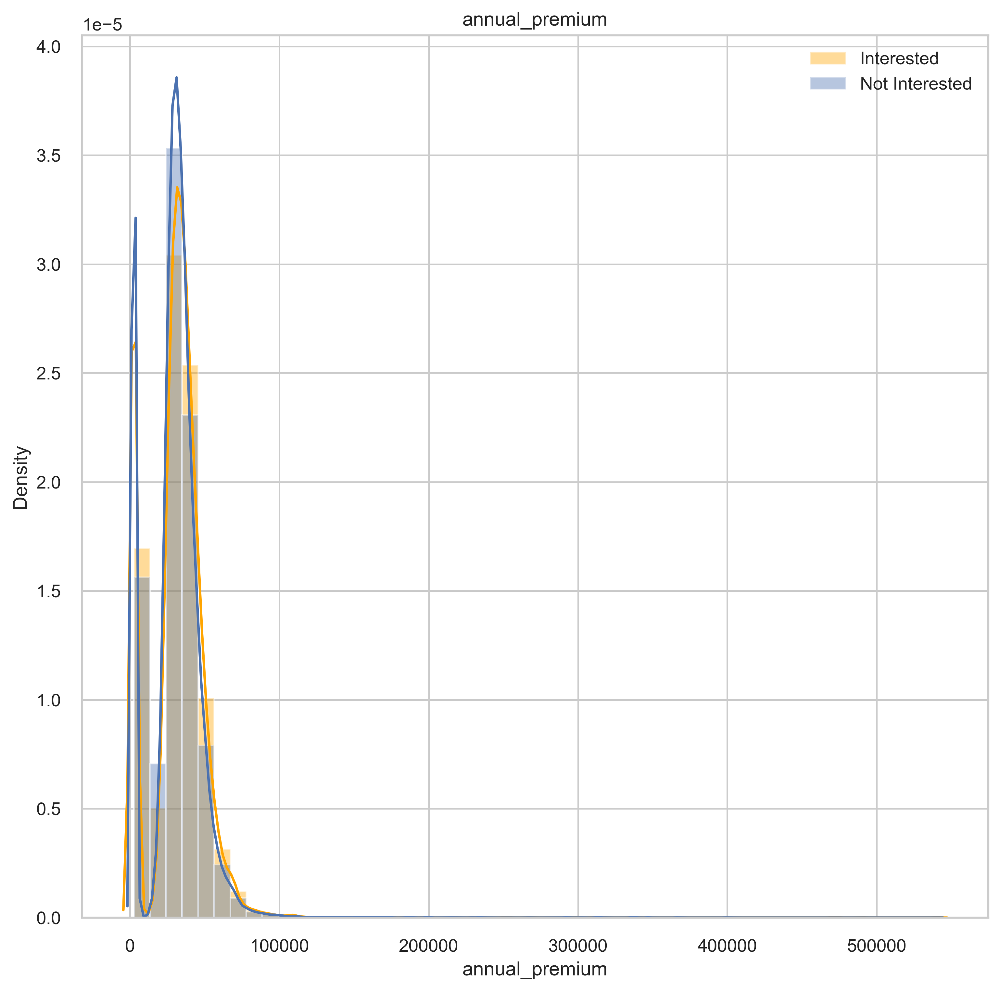

In [320]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']

plt.rcParams['figure.figsize'] = [10, 10]
sns.distplot(num_yes['annual_premium'], color='orange', kde=True, label='Interested')
sns.distplot(num_no['annual_premium'], kde=True, label='Not Interested')
plt.title('annual_premium')
plt.legend();

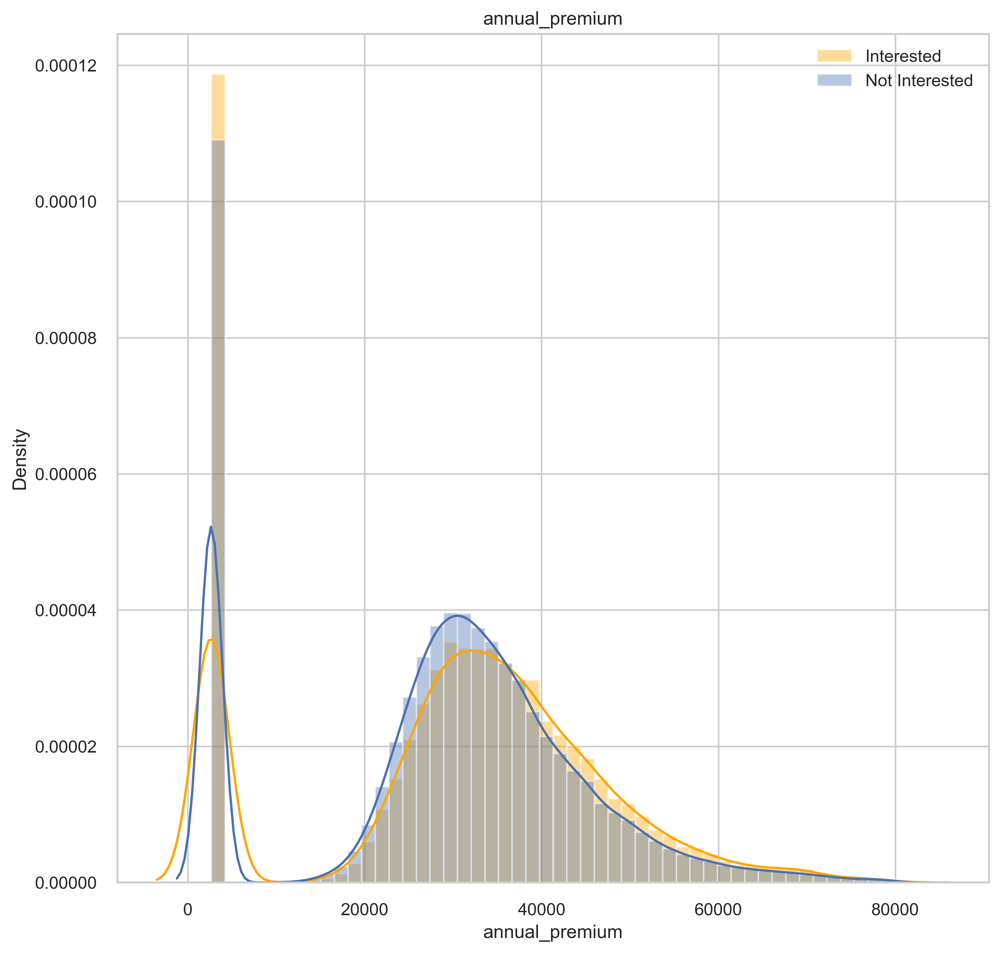

In [319]:
num_yes = df3_train[(df3_train['response_str'] == 'yes') & (df3_train['annual_premium'] > 0) & (df3_train['annual_premium'] < 80000)] 
num_no = df3_train[(df3_train['response_str'] == 'no') & (df3_train['annual_premium'] > 0) & (df3_train['annual_premium'] < 80000)]

plt.rcParams['figure.figsize'] = [10, 10]
sns.distplot(num_yes['annual_premium'], color='orange', kde=True, label='Interested')
sns.distplot(num_no['annual_premium'], kde=True, label='Not Interested')
plt.title('annual_premium')
plt.legend();

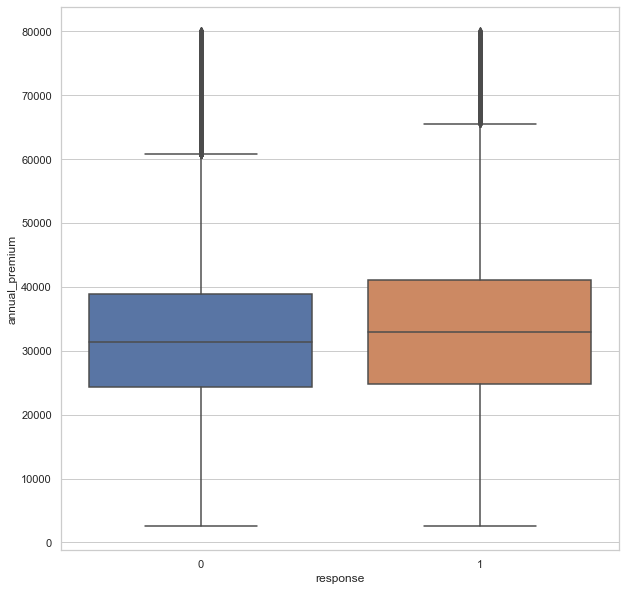

In [78]:
plt.rcParams['figure.figsize'] = [10, 10]
a=df3_train[(df3_train['annual_premium'] < 80000)]
sns.boxplot(x= 'response', y='annual_premium', data=a); 

In [79]:
a=df3_train[(df3_train['annual_premium'] > 80000)]
a.shape[0]

1750

In [80]:
a=df3_train[(df3_train['annual_premium'] > 100000)]
a.shape[0]

596

In [81]:
df3_train.shape[0]

285831

### H7 - The more time a client stays with the company, more likely it is to buy a car insurance: False

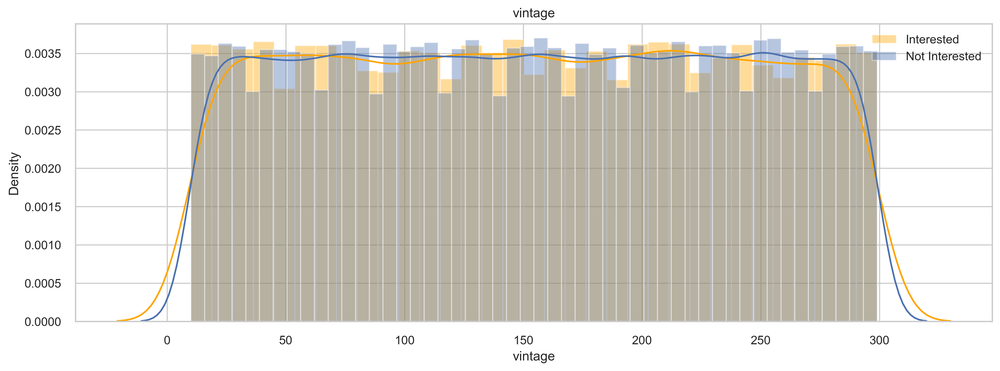

In [321]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']

plt.rcParams['figure.figsize'] = [15, 5]
sns.distplot(num_yes['vintage'], color='orange', kde=True, label='Interested')
sns.distplot(num_no['vintage'], kde=True, label='Not Interested')
plt.title('vintage')
plt.legend();

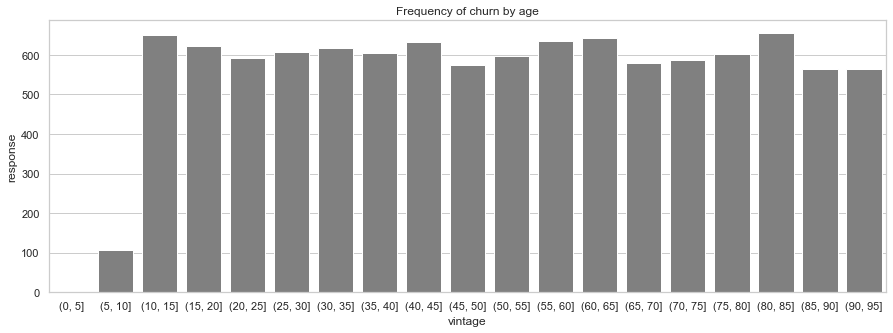

In [83]:
aux1 = df3_train[df3_train['response'] == 1 ][['response', 'vintage']].groupby(['vintage']).sum().reset_index()
bins = list( np.arange( 0, 100, 5) )
aux2 = aux1
aux2['vintage'] = pd.cut(aux1['vintage'], bins=bins)
aux3 = aux2[['response', 'vintage']].groupby(['vintage']).sum().reset_index()
sns.barplot(x='vintage', y='response', data=aux3, color='grey')
plt.title('Frequency of churn by age');

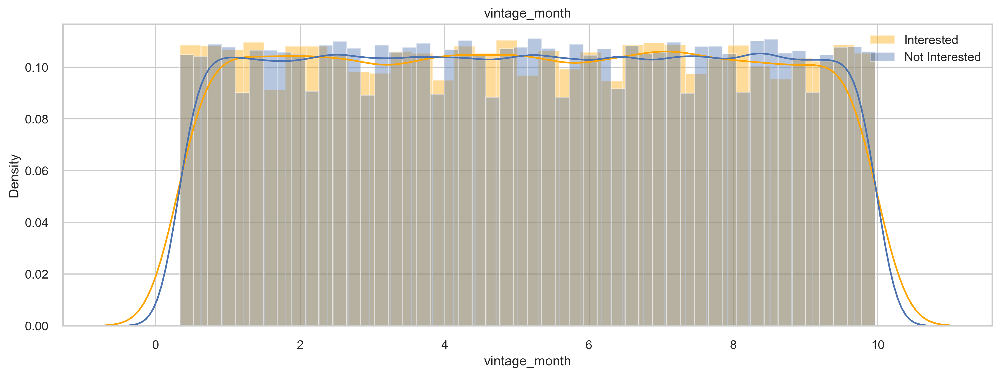

In [322]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']

plt.rcParams['figure.figsize'] = [15, 5]
sns.distplot(num_yes['vintage_month'], color='orange', kde=True, label='Interested')
sns.distplot(num_no['vintage_month'], kde=True, label='Not Interested')
plt.title('vintage_month')
plt.legend();

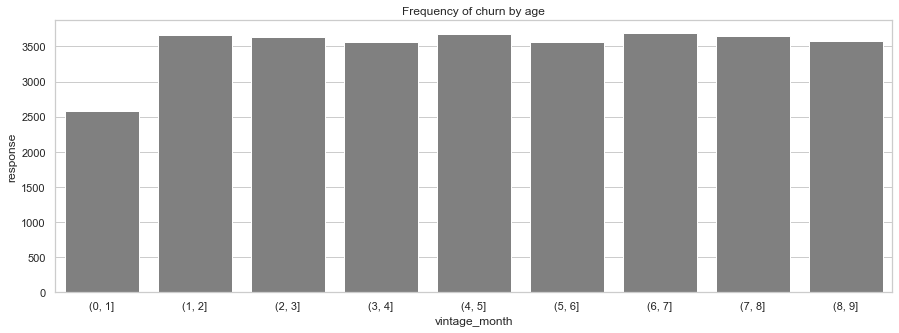

In [85]:
aux1 = df3_train[df3_train['response'] == 1 ][['response', 'vintage_month']].groupby(['vintage_month']).sum().reset_index()
bins = list( np.arange( 0, 10, 1) )
aux2 = aux1
aux2['vintage_month'] = pd.cut(aux1['vintage_month'], bins=bins)
aux3 = aux2[['response', 'vintage_month']].groupby(['vintage_month']).sum().reset_index()
sns.barplot(x='vintage_month', y='response', data=aux3, color='grey')
plt.title('Frequency of churn by age');

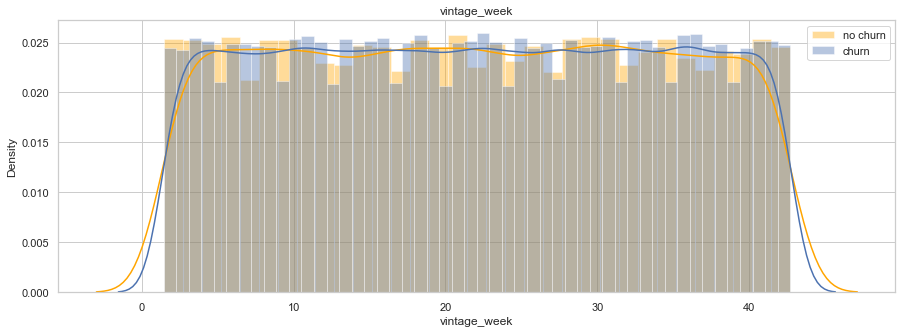

In [86]:
num_yes = df3_train[df3_train['response_str'] == 'yes']
num_no = df3_train[df3_train['response_str'] == 'no']

plt.rcParams['figure.figsize'] = [15, 5]
sns.distplot(num_yes['vintage_week'], color='orange', kde=True, label='no churn')
sns.distplot(num_no['vintage_week'], kde=True, label='churn')
plt.title('vintage_week')
plt.legend();

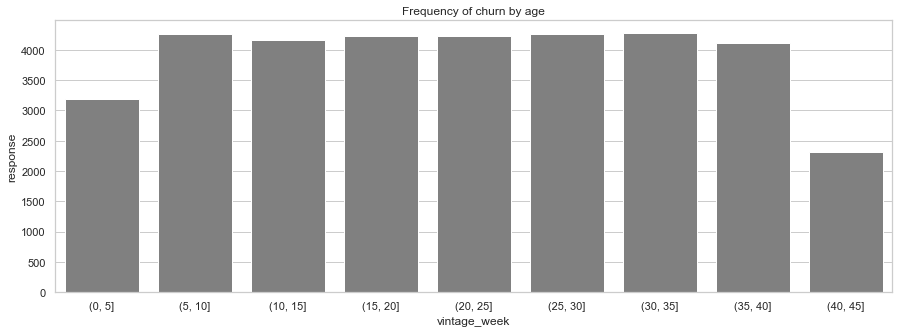

In [87]:
aux1 = df3_train[df3_train['response'] == 1 ][['response', 'vintage_week']].groupby(['vintage_week']).sum().reset_index()
bins = list( np.arange( 0, 50, 5) )
aux2 = aux1
aux2['vintage_week'] = pd.cut(aux1['vintage_week'], bins=bins)
aux3 = aux2[['response', 'vintage_week']].groupby(['vintage_week']).sum().reset_index()
sns.barplot(x='vintage_week', y='response', data=aux3, color='grey')
plt.title('Frequency of churn by age');

### H8 - Customers with driving licence are more likely to buy a car insurance: True

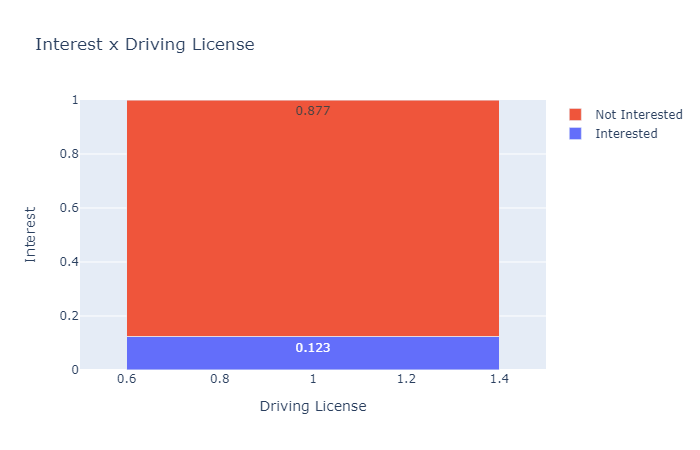

In [323]:
data3a = dict(type='bar',
         x=df3_train['driving_license'],
         y=df3_train[df3_train['response_str']=='yes']['driving_license'].value_counts(sort=False),
         name='Interested',
         text=round(df3_train[df3_train['response_str']=='yes']['driving_license'].value_counts(sort=False)/df3_train['driving_license'].value_counts(sort=False),3),
            textposition='auto',
                    )

data3b = dict(type='bar',
         x=df3_train['driving_license'],
         y=df3_train[df3_train['response_str']=='no']['driving_license'].value_counts(sort=False),
         name='Not Interested',
              text=round(df3_train[df3_train['response_str']=='no']['driving_license'].value_counts(sort=False)/df3_train['driving_license'].value_counts(sort=False),3),
            textposition='auto',
               )


data3=[data3a, data3b]

layout3= dict(title=dict(text='Interest x Driving License'),
                 yaxis=dict(title='Interest'),
                 xaxis=dict(title='Driving License'),
                barmode='stack',
               barnorm='fraction'
                )

fig3=go.Figure(data=data3, layout=layout3)
fig3.show(renderer='png')

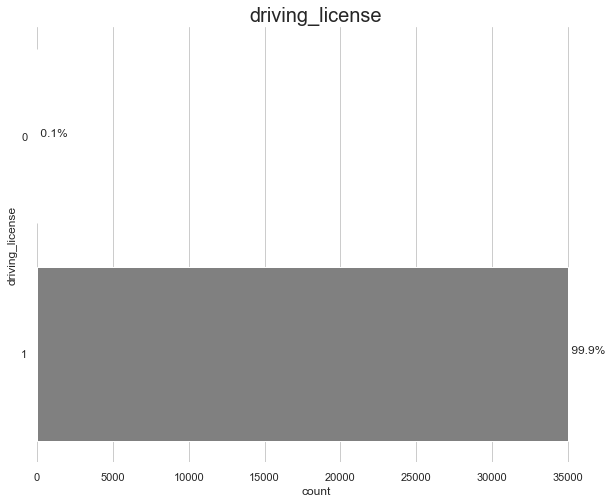

In [89]:
plt.figure(figsize(10,8))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='driving_license', data=aux1, color='grey')
plt.title('driving_license', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H9 - The are regions where customers are more likely to buy  a car insurance: True

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
region_code,38.0,28.0,51.0,19.0,4.0,23.0,24.0,7.0,18.0,3.0,52.0,35.0,40.0,39.0,29.0
response,0.194737,0.186583,0.167939,0.162996,0.162183,0.152189,0.140991,0.133091,0.131177,0.130124,0.128713,0.125820,0.124363,0.122420,0.121374


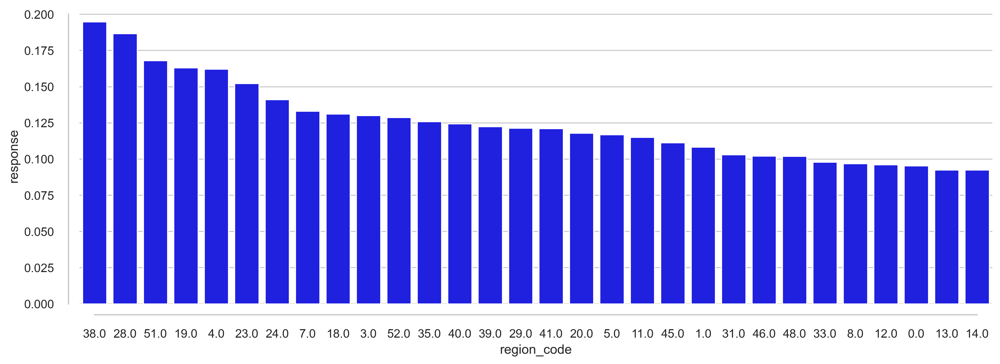

In [324]:
aux = df3_train[['region_code', 'response']].groupby('region_code').mean().sort_values(by = 'response', ascending = False).reset_index() 
sns.barplot(x = 'region_code', y = 'response', data = aux, order = aux['region_code'].head(30), color='blue')
sns.despine(offset = 10, trim = True)
aux.head(15).T

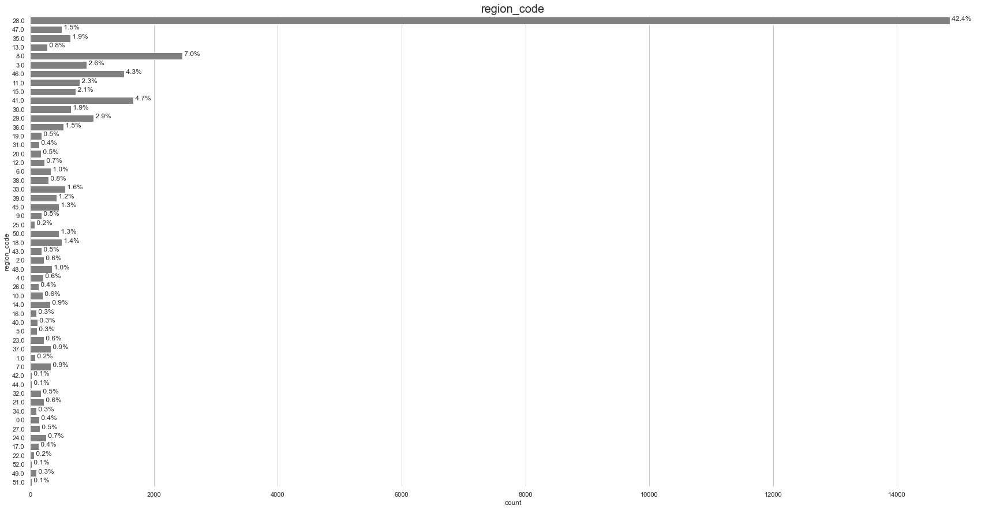

In [91]:
plt.figure(figsize(30,15))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='region_code', data=aux1, color='grey')
plt.title('region_code', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

### H10 - There are sales channels that costumers engage more: True

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
policy_sales_channel,123.0,43.0,87.0,27.0,2.0,80.0,121.0,155.0,163.0,3.0,158.0,81.0,157.0,150.0,36.0
response,1.000000,1.000000,0.500000,0.500000,0.500000,0.363636,0.320000,0.317846,0.302778,0.301235,0.279891,0.272727,0.272162,0.261803,0.250000


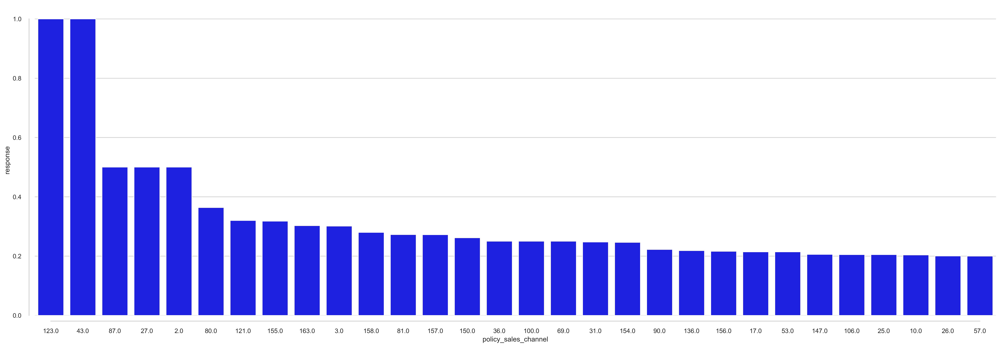

In [334]:
aux = df3_train[['policy_sales_channel', 'response']].groupby('policy_sales_channel').mean().sort_values(by = 'response', ascending = False).reset_index() 
sns.barplot(x = 'policy_sales_channel', y = 'response', data = aux.head(30), order = aux['policy_sales_channel'].head(30), color='blue')
sns.despine(offset = 10, trim = True);
aux.head(15).T

In [93]:
df3_train[(df3_train['policy_sales_channel']=='43.0')]

,id_cust,gender,age,region_code,policy_sales_channel,driving_license,vehicle_age,vehicle_damage,previously_insured,annual_premium,vintage,response,previously_insured_str,response_str,driving_license_str,vehicle_damage_num,age_class,vintage_class,vintage_month,vintage_week,annual_premium_bins,vehicle_age_num,vintage_customer_age,customer_vehicle_age,premium_vintage,premium_customer_age,insured_licence,vehicle_age_insured,vehicle_age_damaged,annual_premium_per_ap_mean_rc,annual_premium_per_ap_mean_psc,age_vintage
273806,228806,Male,45,28.0,43.0,1,1-2 Year,Yes,0,"57,744.000000",277,1,no,yes,yes,1,Adult,4,9.233333,39.571429,1,2,6.155556,90,208.462094,"1,283.200000",0,0,2,1.494129,1.000000,59.296029


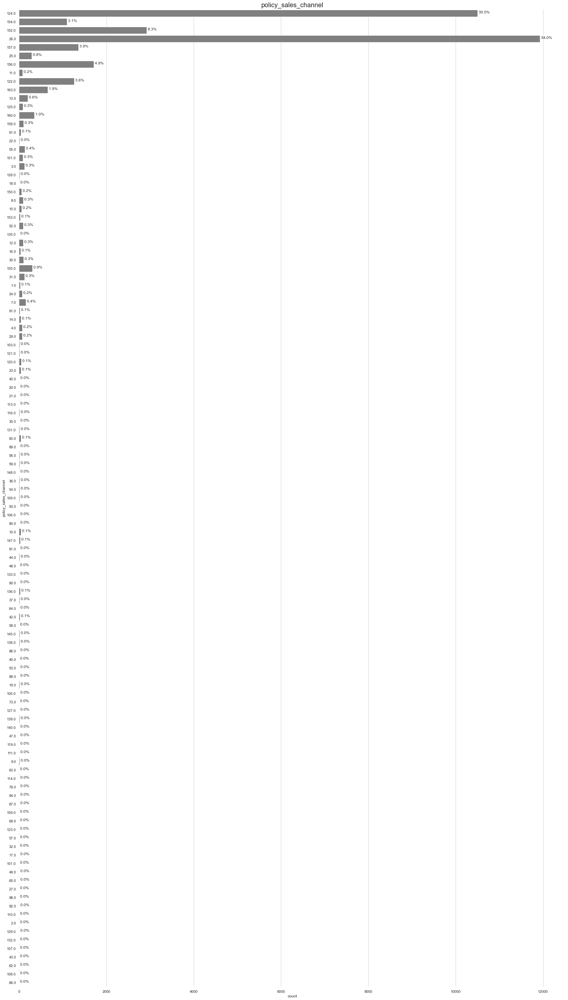

In [94]:
plt.figure(figsize(30,55))
aux1 = df3_train[df3_train['response'] == 1 ]

ax = sns.countplot(y='policy_sales_channel', data=aux1, color='grey')
plt.title('policy_sales_channel', size =20)
sns.despine( bottom=True, left=True)
total = aux1['response'].size
for p in ax.patches:
        percentage = ' {:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

###  H11 -  Interest is greater with costumers that live in a higher average damage city (higher than 50%): True

In [95]:
aux = df3_train.groupby('region_code', as_index=False)['vehicle_damage_num'].mean()

In [96]:
aux1 = df3_train.merge(aux[['region_code', 'vehicle_damage_num']], on='region_code', how='left')

In [97]:
aux25 = aux1[aux1['vehicle_damage_num_y']>0.5]
aux26 = aux1[aux1['vehicle_damage_num_y']<0.5]

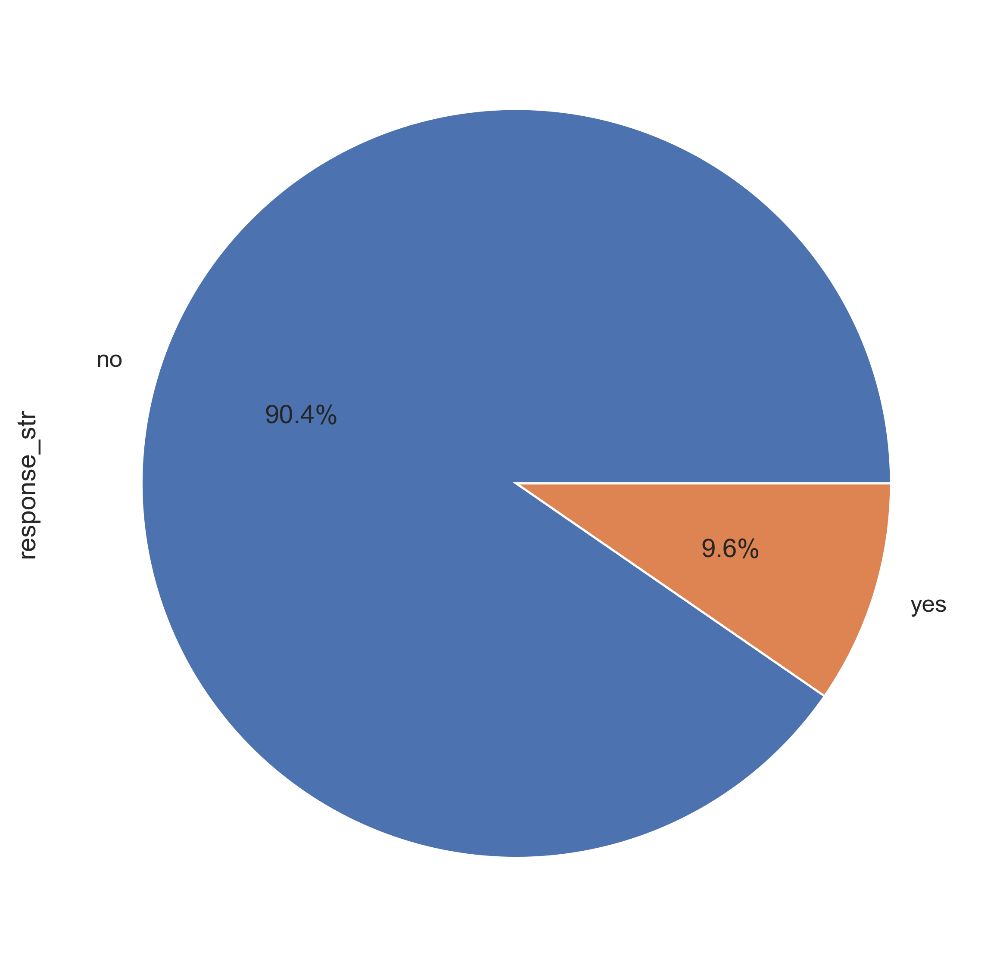

In [328]:
data = aux25.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8));

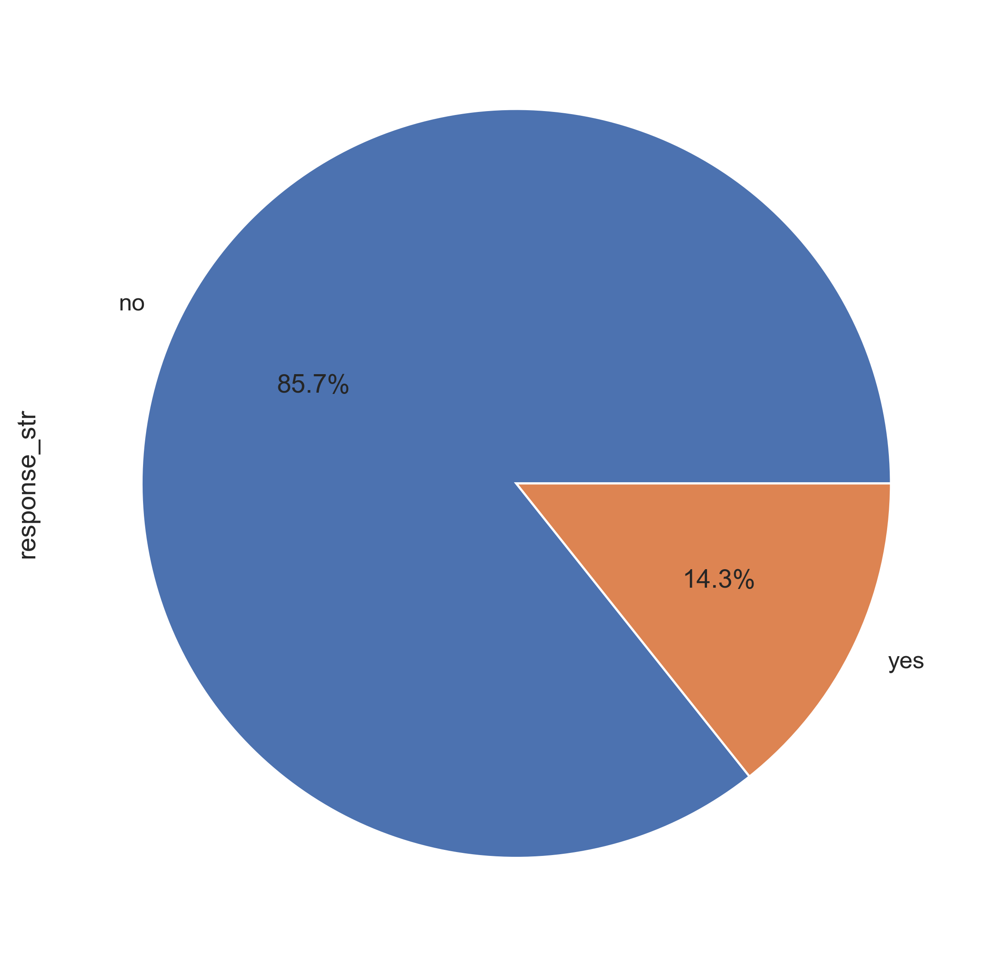

In [327]:
data = aux26.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8));

###  H12 - Older customers who pay more for annual health insurance are more likely to get the car insurance: False

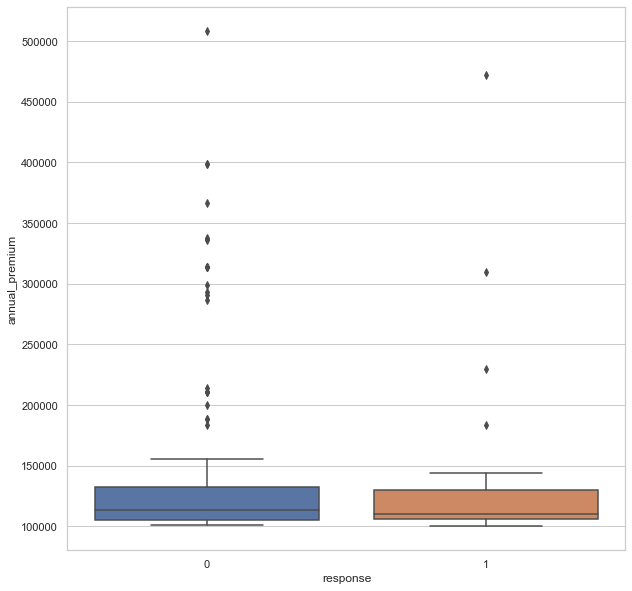

In [100]:
aux=df3_train[(df3_train['age_class']=='Middle Age') & (df3_train['annual_premium'] > 100000)]
plt.rcParams['figure.figsize'] = [10, 10]
sns.boxplot(x= 'response', y='annual_premium', data=aux); 

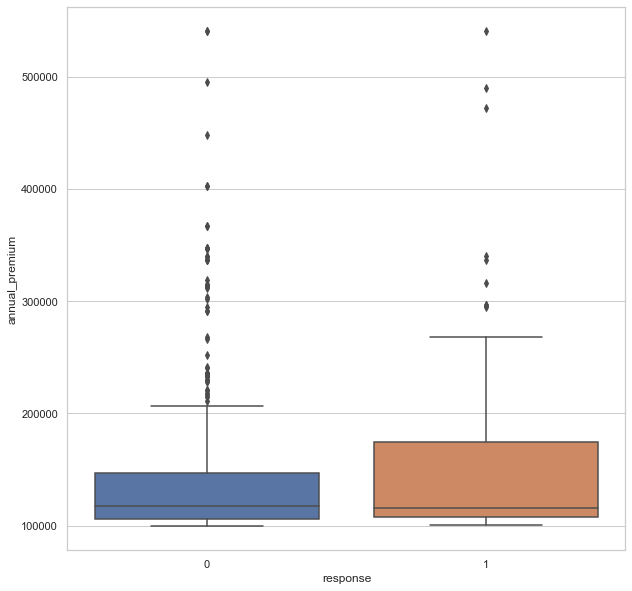

In [101]:
aux=df3_train[(df3_train['age_class'] != 'Middle Age') & (df3_train['annual_premium'] > 100000)]
plt.rcParams['figure.figsize'] = [10, 10]
sns.boxplot(x= 'response', y='annual_premium', data=aux); 

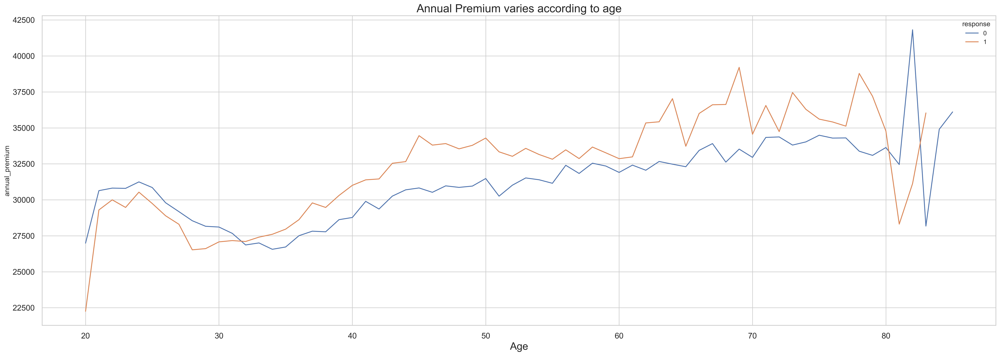

In [329]:
data = df3_train.groupby(['age','response'])['annual_premium'].mean().reset_index()
plt.rcParams['figure.figsize'] = [30, 10]
sns.lineplot(x='age', y='annual_premium', data=data, hue='response')
plt.title('Annual Premium varies according to age', size=20)
plt.xlabel('Age', size=18)
plt.xticks(size=14)
plt.yticks(size=14);

###  H13 - Customers in regions with more previoulsy insured are more likely to get health insurance: False

In [103]:
aux = df3_train.groupby('region_code', as_index=False)['previously_insured'].mean()
aux1 = df3_train.merge(aux[['region_code', 'previously_insured']], on='region_code', how='left')
aux25 = aux1[aux1['previously_insured_y']>0.5]
aux26 = aux1[aux1['previously_insured_y']<0.5]

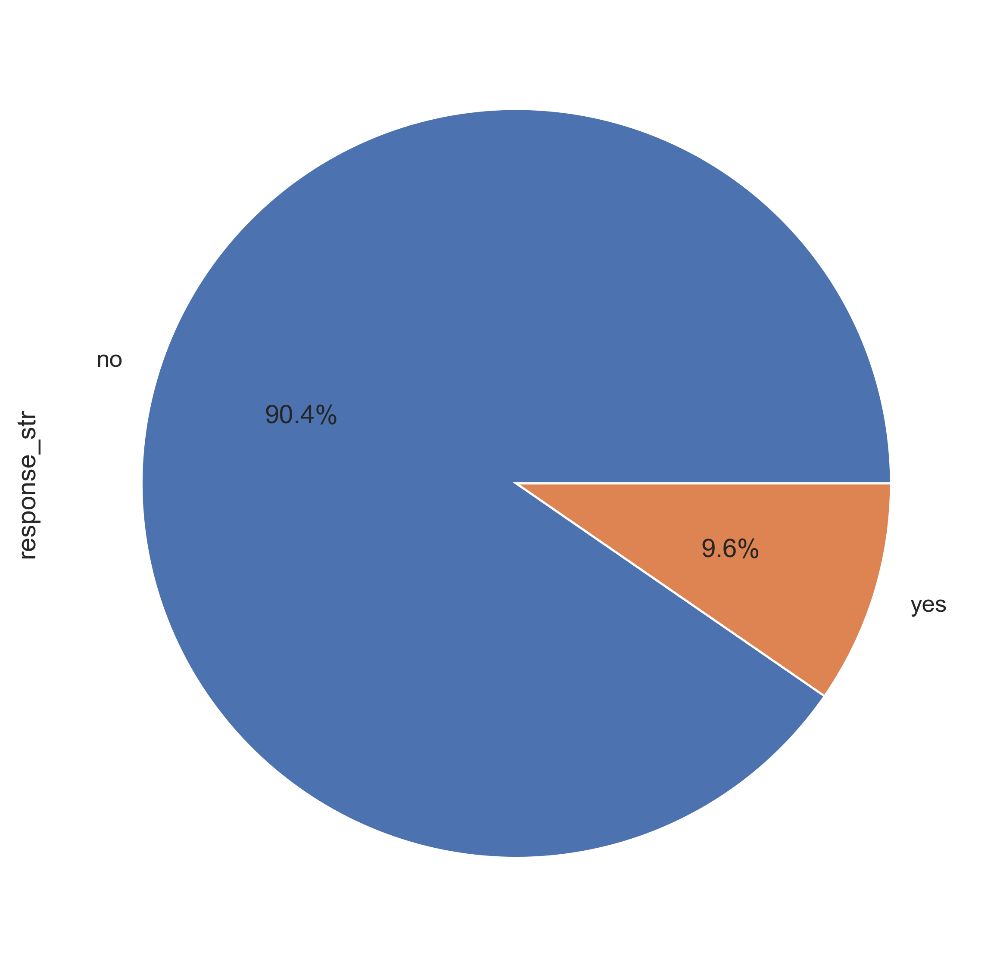

In [331]:
data = aux25.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8));

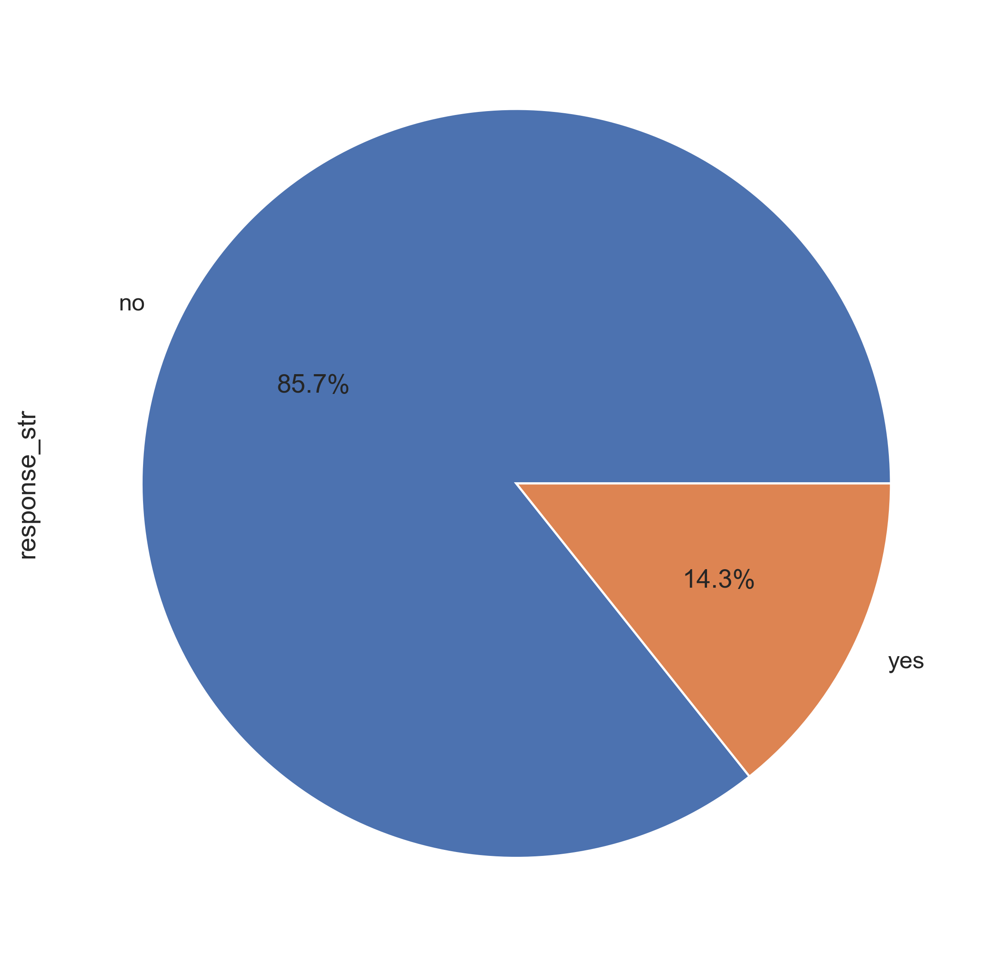

In [330]:
data = aux26.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8));

###  H14 - Customers with previoulsy insured and older cars are more likely to get health insurance: True

<AxesSubplot:ylabel='response_str'>

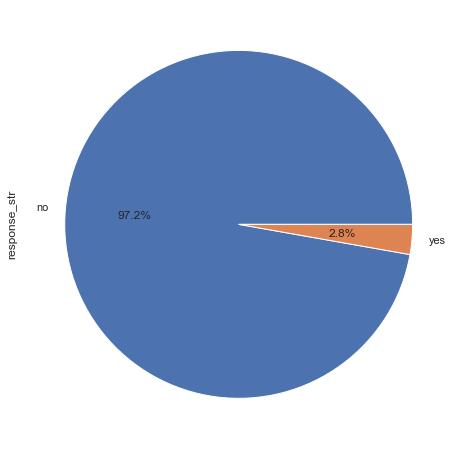

In [106]:
aux=df3_train[(df3_train['previously_insured_str']=='yes') & (df3_train['vehicle_age'] == '> 2 Years')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

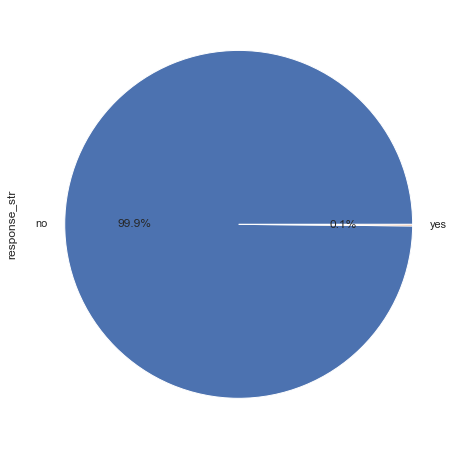

In [107]:
aux=df3_train[(df3_train['previously_insured_str']=='yes') & (df3_train['vehicle_age'] == '1-2 Year')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

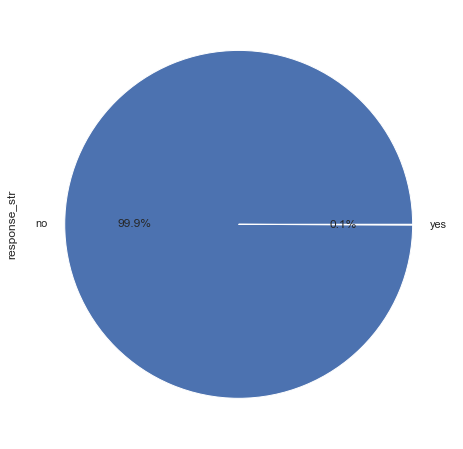

In [108]:
aux=df3_train[(df3_train['previously_insured_str']=='yes') & (df3_train['vehicle_age'] == '< 1 Year')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

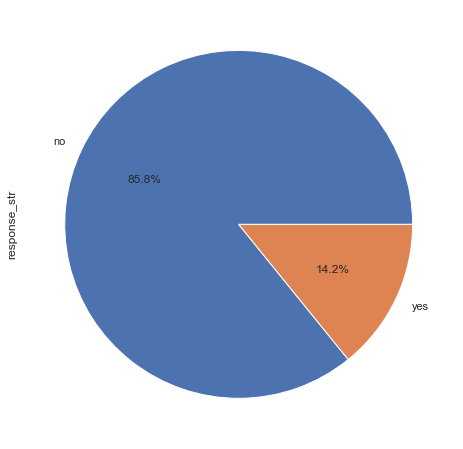

In [109]:
aux=df3_train[(df3_train['vehicle_damage']=='Yes') & (df3_train['vehicle_age'] == '< 1 Year')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

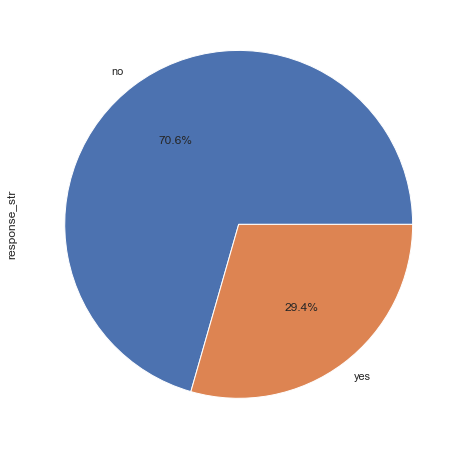

In [110]:
aux=df3_train[(df3_train['vehicle_damage']=='Yes') & (df3_train['vehicle_age'] == '> 2 Years')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

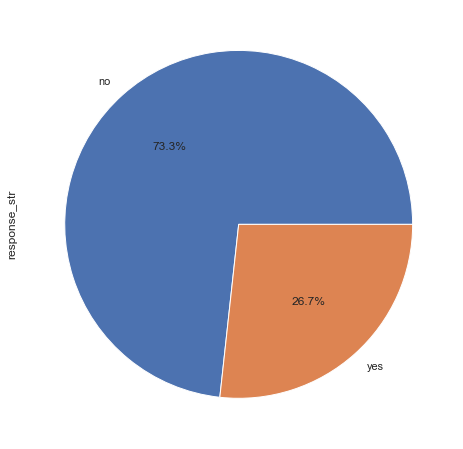

In [111]:
aux=df3_train[(df3_train['vehicle_damage']=='Yes') & (df3_train['vehicle_age'] == '1-2 Year')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

###  H15 - Customers with previoulsy insured are damaged vehicules to be interested the car insurance: False

<AxesSubplot:ylabel='response_str'>

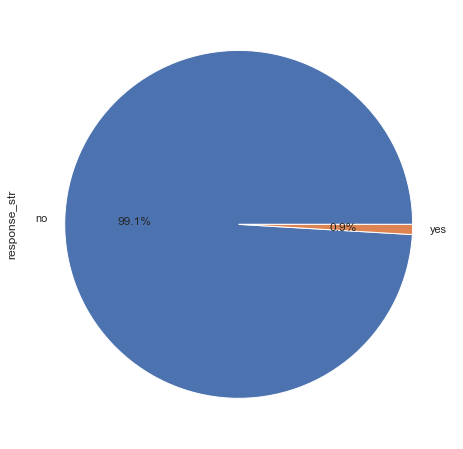

In [112]:
aux=df3_train[(df3_train['vehicle_damage']=='Yes') & (df3_train['previously_insured_str'] == 'yes')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

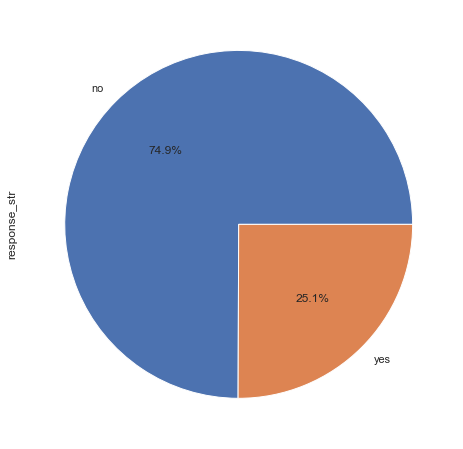

In [113]:
aux=df3_train[(df3_train['vehicle_damage']=='Yes') & (df3_train['previously_insured_str'] == 'no')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

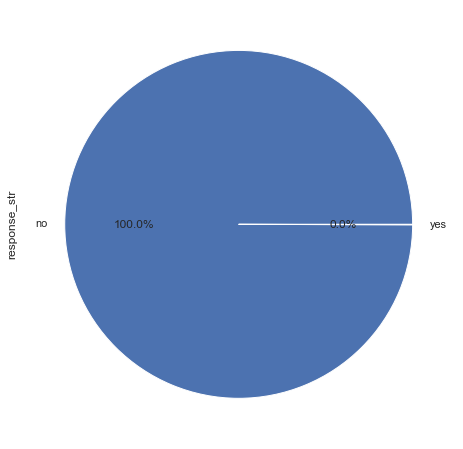

In [114]:
aux=df3_train[(df3_train['vehicle_damage']=='No') & (df3_train['previously_insured_str'] == 'yes')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

<AxesSubplot:ylabel='response_str'>

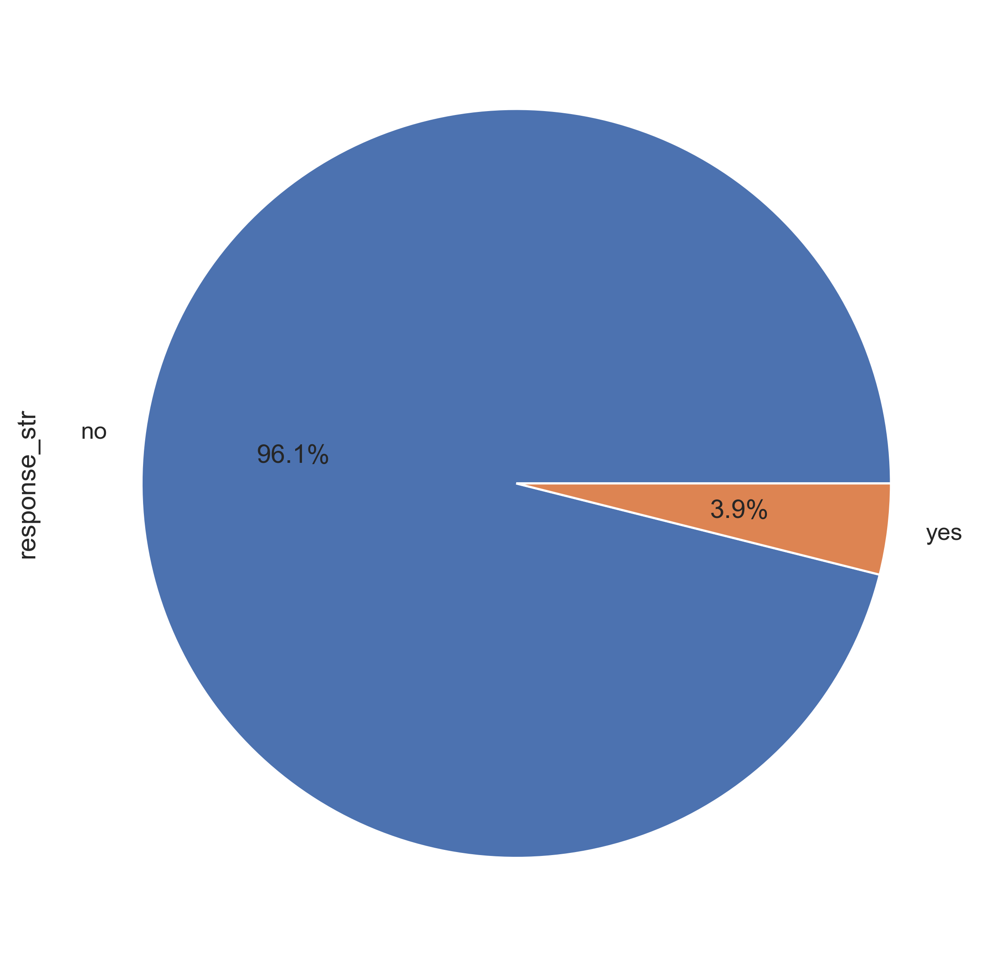

In [332]:
aux=df3_train[(df3_train['vehicle_damage']=='No') & (df3_train['previously_insured_str'] == 'no')]
data = aux.groupby('response_str')['response_str'].count()
data.plot.pie(autopct="%.1f%%", figsize=(8, 8))

## 4.4 Multivariate Analysis

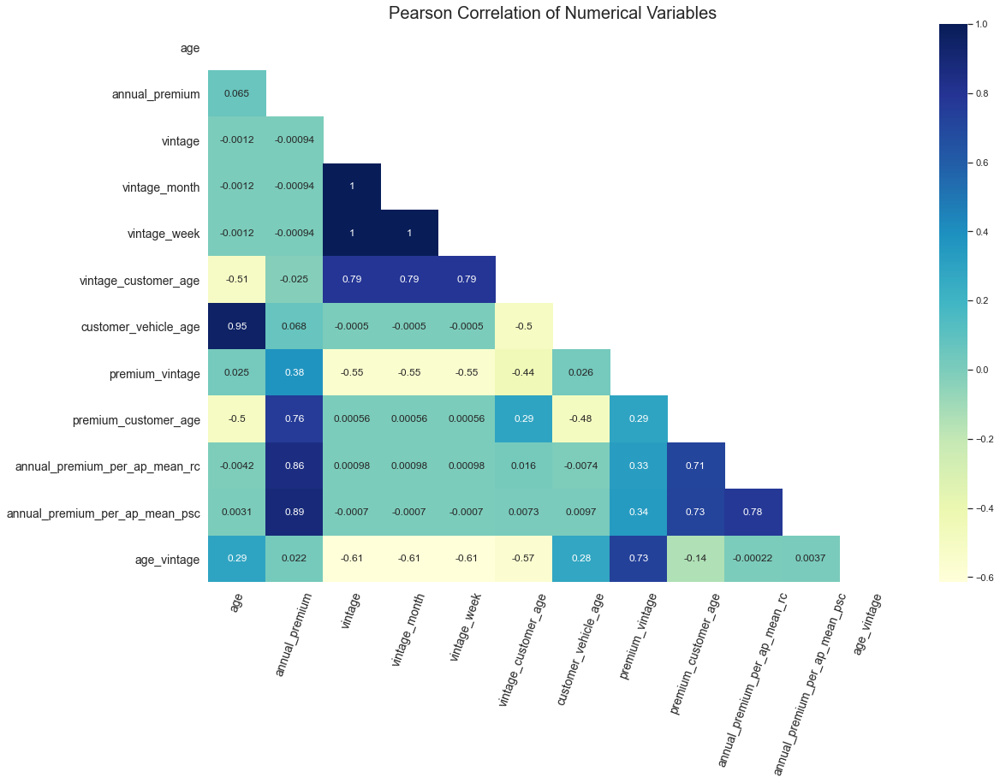

In [116]:
# correlation
corr = num_att.corr(method='pearson')

# Creating a with mask for the superior triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    # Creating the chart with mask
    plt.figure(figsize(18,12))
    ax = sns.heatmap(corr, mask=mask, annot = True, cmap = 'YlGnBu')
    plt.xticks(size = 14, rotation=70)
    plt.yticks(size = 14)
    plt.title("Pearson Correlation of Numerical Variables", size=20);

Due to a correlation equal or higher than 0.77 we are going to remove the features: vintage_week, vintage_month, vintage_customer_age, custumer_vehicle_age, annual_premium_per_ap_mean_rc, annual_premium_per_ap_mean_psc, premium_customer_age

In [117]:
profile = ProfileReport(cat_att, title='Categorical Variables') 
profile.to_file(output_file='Categorical Variables')

Due to correlation in Cramers V we are going to remove the features: vehicle_age, vehicle_age_insured, vehicle_age_damaged, previously_insured_str, insured_license

# 5. Data Preparation

In [118]:
df3_train = df2_train.copy()
df3_test = df2_test.copy()
df3_train.head()

,id_cust,gender,age,region_code,policy_sales_channel,driving_license,vehicle_age,vehicle_damage,previously_insured,annual_premium,vintage,response,previously_insured_str,response_str,driving_license_str,vehicle_damage_num,age_class,vintage_class,vintage_month,vintage_week,annual_premium_bins,vehicle_age_num,vintage_customer_age,customer_vehicle_age,premium_vintage,premium_customer_age,insured_licence,vehicle_age_insured,vehicle_age_damaged,annual_premium_per_ap_mean_rc,annual_premium_per_ap_mean_psc,age_vintage
0,360514,Male,71,28.0,124.0,1,1-2 Year,Yes,0,"49,594.000000",191,0,no,no,yes,1,Old,3,6.366667,27.285714,1,2,2.690141,142,259.654450,698.507042,0,0,2,1.283247,1.563975,135.680628
1,302141,Female,24,41.0,152.0,1,< 1 Year,No,0,"24,190.000000",139,0,no,no,yes,0,Young Adult,2,4.633333,19.857143,1,1,5.791667,24,174.028777,"1,007.916667",0,0,0,0.783320,0.782837,63.021583
2,314140,Female,41,28.0,26.0,1,1-2 Year,Yes,0,"32,870.000000",45,0,no,no,yes,1,Adult,1,1.500000,6.428571,1,2,1.097561,82,730.444444,801.707317,0,0,2,0.850513,0.976500,332.555556
3,40099,Female,26,3.0,160.0,1,< 1 Year,Yes,0,"2,630.000000",217,0,no,no,yes,1,Young Adult,3,7.233333,31.000000,1,1,8.346154,26,12.119816,101.153846,0,0,1,0.107298,0.102617,43.732719
4,258325,Female,21,8.0,152.0,1,< 1 Year,No,1,"32,768.000000",47,0,yes,no,yes,0,Young Adult,1,1.566667,6.714286,1,1,2.238095,21,697.191489,"1,560.380952",1,1,0,0.897395,1.060438,163.085106


## 5.1 Delete correlated features

In [119]:
columnstr=['vintage_week', 'vintage_month', 'vintage_customer_age', 'customer_vehicle_age', 'annual_premium_per_ap_mean_rc', 'annual_premium_per_ap_mean_psc','premium_customer_age', 'vehicle_age_insured', 'vehicle_age_num','vehicle_age_damaged', 'previously_insured_str', 'previously_insured_str', 'response_str', 'driving_license_str','vehicle_damage']
columns=['vintage_week', 'vintage_month', 'vintage_customer_age', 'customer_vehicle_age','premium_customer_age','vehicle_age_num', 'vehicle_age_insured', 'vehicle_age_damaged', 'previously_insured_str', 'previously_insured_str', 'response_str', 'driving_license_str','vehicle_damage']
df3_train = df3_train.drop(columns=columnstr, axis=1)
df3_test = df3_test.drop(columns=columns, axis=1)

## 5.2 Filter rows

In this cycle, we will keep all rows, but we should see with the business team about the annual premiums higher than 400000.

## 5.3 Data Transformation

In [120]:
from sklearn             import base
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

class KFoldTargetEncoder(base.BaseEstimator,base.TransformerMixin):
    
    def __init__(self,colnames,targetName,
                  n_fold=5, verbosity=True,
                  discardOriginal_col=False):
        self.colnames = colnames
        self.targetName = targetName
        self.n_fold = n_fold
        self.verbosity = verbosity
        self.discardOriginal_col = discardOriginal_col
        
    def fit(self, X, y=None):
        
        return self
    
    
    def transform(self,X):
    
        mean_of_target = X[self.targetName].mean()
        kf = KFold(n_splits = self.n_fold,
                   shuffle = True, random_state=2021)
        print(kf)
        col_mean_name = self.colnames + '_' + 'Kfold_Target_Enc'
        X[col_mean_name] = np.nan
        
        for tr_ind, val_ind in kf.split(X):
            X_tr, X_val = X.iloc[tr_ind], X.iloc[val_ind]
            
            #train set and validation set
            X.loc[X.index[val_ind], col_mean_name] = X_val[self.colnames].map(X_tr.groupby(self.colnames)
                                     [self.targetName].mean())
            
            #test set you take the average of the target values of all samples that have a given category in the entire train set.
            X[col_mean_name].fillna(mean_of_target, inplace = True)
            
        if self.verbosity:
            encoded_feature = X[col_mean_name].values
            print('Correlation between the new feature, {} and, {} is {}.'.format(col_mean_name,self.targetName,                    
                   np.corrcoef(X[self.targetName].values,
                               encoded_feature)[0][1]))
            
        if self.discardOriginal_col:
            X = X.drop(self.targetName, axis=1)
            
        return X

In [121]:
target_encoder = KFoldTargetEncoder('region_code','response',n_fold=5)
df3_train = target_encoder.fit_transform(df3_train)
df3_test = target_encoder.transform(df3_test)

df3_train[['region_code_Kfold_Target_Enc','region_code']].head(6)

KFold(n_splits=5, random_state=2021, shuffle=True)
Correlation between the new feature, region_code_Kfold_Target_Enc and, response is 0.13620201962940037.
KFold(n_splits=5, random_state=2021, shuffle=True)
Correlation between the new feature, region_code_Kfold_Target_Enc and, response is 0.13783623471054163.


,region_code_Kfold_Target_Enc,region_code
0,0.186498,28.0
1,0.118912,41.0
2,0.186248,28.0
3,0.133572,3.0
4,0.096481,8.0
5,0.186273,28.0


In [122]:
target_encoder = KFoldTargetEncoder('policy_sales_channel','response',n_fold=5)
df3_train = target_encoder.fit_transform(df3_train)
df3_test = target_encoder.transform(df3_test)

df3_train[['policy_sales_channel_Kfold_Target_Enc','region_code']].head(6)

KFold(n_splits=5, random_state=2021, shuffle=True)
Correlation between the new feature, policy_sales_channel_Kfold_Target_Enc and, response is 0.2617629403344404.
KFold(n_splits=5, random_state=2021, shuffle=True)
Correlation between the new feature, policy_sales_channel_Kfold_Target_Enc and, response is 0.25789634340933676.


,policy_sales_channel_Kfold_Target_Enc,region_code
0,0.189211,28.0
1,0.028882,41.0
2,0.198074,28.0
3,0.021706,3.0
4,0.028425,8.0
5,0.186901,28.0


In [123]:
df3_test

,id_cust,gender,age,region_code,policy_sales_channel,driving_license,vehicle_age,previously_insured,annual_premium,vintage,response,vehicle_damage_num,age_class,vintage_class,annual_premium_bins,premium_vintage,insured_licence,age_vintage,region_code_Kfold_Target_Enc,policy_sales_channel_Kfold_Target_Enc
11372,91161,Male,72,7.0,26.0,1,1-2 Year,1,"35,776.000000",270,0,1,Old,4,1,132.503704,1,97.333333,0.139280,0.196391
270751,257644,Male,24,14.0,152.0,1,< 1 Year,0,"28,463.000000",177,0,0,Young Adult,3,1,160.807910,0,49.491525,0.085624,0.028133
259048,164692,Male,22,30.0,152.0,1,< 1 Year,0,"40,907.000000",166,0,1,Young Adult,3,1,246.427711,0,48.373494,0.082141,0.028165
371764,306286,Male,22,6.0,152.0,1,< 1 Year,1,"17,781.000000",143,0,0,Young Adult,2,1,124.342657,1,56.153846,0.070899,0.028165
115985,163956,Male,52,6.0,26.0,1,1-2 Year,0,"18,248.000000",101,0,1,Middle Age,2,1,180.673267,0,187.920792,0.065863,0.195917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5662,45891,Male,21,15.0,152.0,1,< 1 Year,0,"36,933.000000",244,0,1,Young Adult,4,1,151.364754,0,31.413934,0.071913,0.028165
308231,176526,Female,57,12.0,124.0,1,1-2 Year,1,"42,288.000000",76,0,0,Middle Age,1,1,556.421053,1,273.750000,0.101587,0.190608
6217,50237,Male,55,28.0,124.0,1,1-2 Year,0,"29,494.000000",196,0,1,Middle Age,3,1,150.479592,0,102.423469,0.187196,0.189818
273879,283213,Male,41,46.0,156.0,1,1-2 Year,0,"21,649.000000",163,1,1,Adult,3,1,132.815951,0,91.809816,0.106454,0.217925


In [124]:
mms = MinMaxScaler()
rs = RobustScaler()

#age
df3_train['age'] = mms.fit_transform(df3_train[['age']].values)
df3_test['age'] = mms.transform(df3_test[['age']].values)

#vintage
df3_train['vintage'] = mms.fit_transform(df3_train[['vintage']].values)
df3_test['vintage'] = mms.transform(df3_test[['vintage']].values)

#premium_vintage
df3_train['premium_vintage'] = rs.fit_transform(df3_train[['premium_vintage']].values)
df3_test['premium_vintage'] = rs.transform(df3_test[['premium_vintage']].values)


#annual_premium
df3_train['annual_premium'] = rs.fit_transform(df3_train[['annual_premium']].values)
df3_test['annual_premium'] = rs.transform(df3_test[['annual_premium']].values)

#age_vintage
df3_train['age_vintage'] = mms.fit_transform(df3_train[['age_vintage']].values)
df3_test['age_vintage'] = mms.transform(df3_test[['age_vintage']].values)

## 5.4 Data Encoding

Encoding was already made in previously steps

In [125]:
#gender
df3_train['gender'] = df3_train['gender'].map({'Female': 1, 'Male': 0})
df3_test['gender'] = df3_test['gender'].map({'Female': 1, 'Male': 0})

#age class
df3_train['age_class'] = df3_train['age_class'].map({'Young Adult': 0, 'Adult': 1, 'Middle Age': 2, 'Old': 3})
df3_test['age_class'] = df3_test['age_class'].map({'Young Adult': 0, 'Adult': 1, 'Middle Age': 2, 'Old': 3})

#vehicle_age
df3_train = pd.get_dummies( df3_train, prefix='vehicle_age', columns=['vehicle_age'] )
df3_test = pd.get_dummies( df3_test, prefix='vehicle_age', columns=['vehicle_age'] )
df3_train=df3_train.rename(columns={"vehicle_age_< 1 Year": "vehicle_age_plus 1 Year"})
df3_test=df3_test.rename(columns={"vehicle_age_< 1 Year": "vehicle_age_plus 1 Year"})

#vehicle_damage_num, driving_license, previously_insured, vintage_class, annual_premium_bins, vehicle_age_num are already encoded

In [126]:
columns_target_encoder=['region_code','policy_sales_channel']
df3_train = df3_train.drop(columns=columns_target_encoder, axis=1)
df3_test = df3_test.drop(columns=columns_target_encoder, axis=1)

# 6. Feature Selection

In [127]:
df4_train = df3_train.copy()
df4_test = df3_test.copy()

In [128]:
X_train = df4_train.drop(['response'], axis=1)
y_train= df4_train['response']

X_test = df4_test.drop(['response'], axis=1)
y_test = df4_test['response']

In [129]:
X_train['vintage_class'] = X_train['vintage_class'].astype('float64')
X_train['annual_premium_bins'] = X_train['annual_premium_bins'].astype('float64')
X_train['insured_licence'] = X_train['insured_licence'].astype('float64')

X_test['vintage_class'] = X_test['vintage_class'].astype('float64')
X_test['annual_premium_bins'] = X_test['annual_premium_bins'].astype('float64')
X_test['insured_licence'] = X_test['insured_licence'].astype('float64')

df4_train['vintage_class'] = df4_train['vintage_class'].astype('float64')
df4_train['annual_premium_bins'] = df4_train['annual_premium_bins'].astype('float64')
df4_train['insured_licence'] = df4_train['insured_licence'].astype('float64')

df4_test['vintage_class'] = df4_test['vintage_class'].astype('float64')
df4_test['annual_premium_bins'] = df4_test['annual_premium_bins'].astype('float64')
df4_test['insured_licence'] = df4_test['insured_licence'].astype('float64')

df_final = X_test.copy()

## 6.1 Random Forest

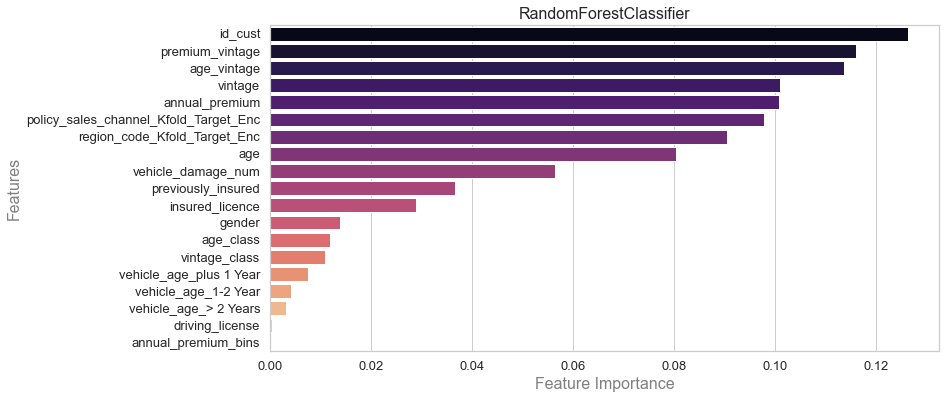

In [130]:
rf = RandomForestClassifier(n_jobs=-1)
feature_selection(rf, X_train, y_train)

## 6.2 Extra Trees

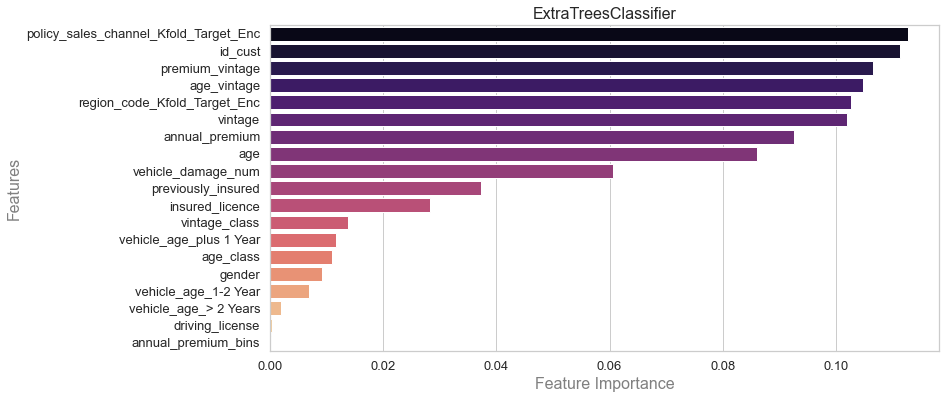

In [131]:
etree = en.ExtraTreesClassifier(n_estimators = 250, random_state=0, n_jobs=-1)
feature_selection(etree, X_train, y_train)

## 6.3 Yellow Bricks

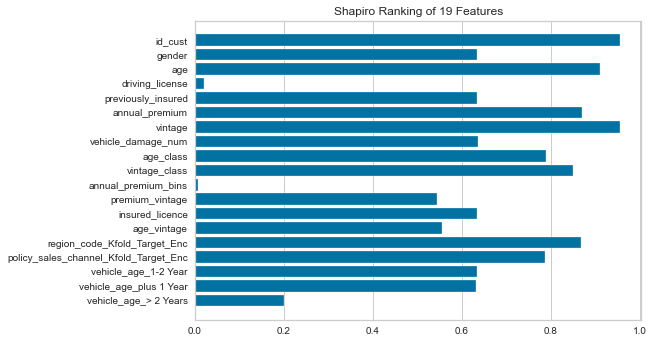

In [132]:
from yellowbrick.features import Rank1D
visualizer = Rank1D(algorithm='shapiro')

visualizer.fit(X_train, y_train)           
visualizer.transform(X_train)        
visualizer.show(); 

## Selected columns:

In [133]:
X_test.columns

Index(['id_cust', 'gender', 'age', 'driving_license', 'previously_insured',
       'annual_premium', 'vintage', 'vehicle_damage_num', 'age_class',
       'vintage_class', 'annual_premium_bins', 'premium_vintage',
       'insured_licence', 'age_vintage', 'region_code_Kfold_Target_Enc',
       'policy_sales_channel_Kfold_Target_Enc', 'vehicle_age_1-2 Year',
       'vehicle_age_plus 1 Year', 'vehicle_age_> 2 Years'],
      dtype='object')

In [184]:
X_train = df4_train[['premium_vintage','age_vintage','annual_premium','vintage','policy_sales_channel_Kfold_Target_Enc','region_code_Kfold_Target_Enc','age','vehicle_damage_num','gender','vehicle_age_1-2 Year', 'vehicle_age_plus 1 Year' ]]
X_test = df4_test[['premium_vintage','age_vintage','annual_premium','vintage','policy_sales_channel_Kfold_Target_Enc','region_code_Kfold_Target_Enc','age','vehicle_damage_num','gender', 'vehicle_age_1-2 Year', 'vehicle_age_plus 1 Year']]


#X_train = df4_train[['annual_premium','vintage','age','vehicle_damage_num','gender','vehicle_age_1-2 Year','vehicle_age_plus 1 Year','driving_license','age_vintage']]
#X_test = df4_test[['annual_premium','vintage','age','vehicle_damage_num','gender','vehicle_age_1-2 Year','vehicle_age_plus 1 Year','driving_license','age_vintage']]

In [185]:
X_test.shape

(95278, 11)

# 7. Machine Learning Models

In [136]:
# Precision @ K
def precision_at_k( data, k=20000 ):
    data = data.reset_index( drop=True )
    data['ranking'] = data.index + 1 
    data['precision_at_k'] = data['response'].cumsum() / data['ranking']

    return data.loc[k, 'precision_at_k']

###########################################################################################################################

# Recall @ K
def recall_at_k( data, k=20000 ):
    data = data.reset_index( drop=True )
    data['ranking'] = data.index + 1 
    data['recall_at_k'] = data['response'].cumsum() / data['response'].sum()

    return data.loc[k, 'recall_at_k']

###########################################################################################################################

# Metrics @ k
def metrics_at_k (data, model, x_train, y_train, x_val, y_val):
    model_df = []     
    
    for model in model:
        print("Training " + type(model).__name__ + "...")
        model.fit(x_train, y_train)

        yhat = model.predict_proba(x_val)
        data = x_val.copy()
        data['response'] = y_val.copy()
        data['score'] = yhat[:, 1].tolist()
        data = data.sort_values('score', ascending=False)

        precision = precision_at_k(data)
        recall = recall_at_k(data)

        df = pd.DataFrame({'Model Name': type(model).__name__,'Precision@K': precision, 
                           'Recall@K': recall}, index = [0]).sort_values('Precision@K', ascending = False)

        model_df.append(df)
        final_model = pd.concat(model_df)
    return final_model.sort_values(by='Precision@K', ascending=False).round(4)

###########################################################################################################################

# Cross Validation
def cross_validation(model, x_train, y_train, k, data):
    kfold = StratifiedKFold(n_splits=k, shuffle=True, random_state=28)
    precision_list=[]
    recall_list=[]
    i=1

    for train_cv, val_cv in kfold.split(x_train, y_train):
        print(f'Fold Number {i}/{k}')
        x_train_fold = x_train.iloc[train_cv]
        y_train_fold = y_train.iloc[train_cv]
        x_val_fold = x_train.iloc[val_cv]
        y_val_fold = y_train.iloc[val_cv]

        model_fit = model.fit(x_train_fold, y_train_fold)
        yhat = model.predict_proba(x_val_fold)

        data = x_val_fold.copy()
        data['response'] = y_val_fold.copy()
        data['score'] = yhat[:, 1].tolist()
        data = data.sort_values('score', ascending=False)

        precision = precision_at_k(data)
        precision_list.append(precision)
        
        recall = recall_at_k(data)
        recall_list.append(recall)
        
        i+=1
        
    df = pd.DataFrame({'Model Name': type(model).__name__, 
                       'Precision@K Mean': round(np.mean(precision_list), 4),
                       'Precision@K STD': round(np.std(precision_list), 4),
                       'Recall@K Mean': round(np.mean(recall_list), 4),
                       'Recall@K STD': round(np.std(recall_list), 4)}, index = [0])
    
    return df


In [186]:
# machine learning
from sklearn.dummy          import DummyClassifier
from sklearn.experimental   import enable_hist_gradient_boosting 
from sklearn.ensemble       import HistGradientBoostingClassifier
from sklearn.ensemble       import AdaBoostClassifier
from sklearn.ensemble       import GradientBoostingClassifier
from sklearn.ensemble       import BaggingClassifier
from sklearn.ensemble       import StackingClassifier
from sklearn.ensemble       import RandomForestClassifier
from sklearn.ensemble       import ExtraTreesClassifier
from sklearn.neighbors      import KNeighborsClassifier
from sklearn.linear_model   import LogisticRegression, SGDClassifier
from sklearn.naive_bayes    import GaussianNB
from imblearn.ensemble      import BalancedRandomForestClassifier
from lightgbm               import LGBMClassifier
from catboost               import CatBoostClassifier
from xgboost                import XGBClassifier


# models
estimators = [('lgbm', LGBMClassifier(n_jobs=-1)),
              ('xgb', XGBClassifier(verbosity=0))]

# models
model=[AdaBoostClassifier(),
       GradientBoostingClassifier(),
       BaggingClassifier(base_estimator=LGBMClassifier(n_jobs=-1)),
       StackingClassifier(estimators=estimators, final_estimator=LGBMClassifier(n_jobs=-1)),
       HistGradientBoostingClassifier(),
       CatBoostClassifier(verbose=False),
       XGBClassifier(verbosity=0),
       LGBMClassifier(n_jobs=-1),
       LogisticRegression(),
       RandomForestClassifier(),
       ExtraTreesClassifier(),
       BalancedRandomForestClassifier(),
       KNeighborsClassifier(n_jobs=-1),
       SGDClassifier(loss='log', n_jobs=-1), 
       GaussianNB(),
       DummyClassifier()]

metrics_at_k(df4_train, model, X_train, y_train, X_train, y_train)

Training AdaBoostClassifier...
Training GradientBoostingClassifier...
Training BaggingClassifier...
Training StackingClassifier...
Training HistGradientBoostingClassifier...
Training CatBoostClassifier...
Training XGBClassifier...
Training LGBMClassifier...
Training LogisticRegression...
Training RandomForestClassifier...
Training ExtraTreesClassifier...
Training BalancedRandomForestClassifier...
Training KNeighborsClassifier...
Training SGDClassifier...
Training GaussianNB...
Training DummyClassifier...


,Model Name,Precision@K,Recall@K
0,RandomForestClassifier,1.000000,0.570900
0,ExtraTreesClassifier,1.000000,0.570900
0,BalancedRandomForestClassifier,0.997900,0.569700
0,KNeighborsClassifier,0.612100,0.349500
0,CatBoostClassifier,0.525000,0.299800
0,XGBClassifier,0.499700,0.285300
0,LGBMClassifier,0.429300,0.245100
0,BaggingClassifier,0.427200,0.243900
0,StackingClassifier,0.424900,0.242600
0,HistGradientBoostingClassifier,0.416800,0.238000


In [187]:
cross_validation(AdaBoostClassifier(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,AdaBoostClassifier,0.295100,0.000600,0.842400,0.001800


In [188]:
cross_validation(LogisticRegression(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,LogisticRegression,0.292700,0.000900,0.835500,0.002400


In [189]:
cross_validation(HistGradientBoostingClassifier(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,HistGradientBoostingClassifier,0.296600,0.000900,0.846700,0.002600


In [190]:
cross_validation(LGBMClassifier(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,LGBMClassifier,0.296700,0.001000,0.847100,0.002900


In [191]:
cross_validation(RandomForestClassifier(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,RandomForestClassifier,0.286400,0.000800,0.817600,0.002300


In [192]:
cross_validation(XGBClassifier(), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,XGBClassifier,0.296100,0.001300,0.845400,0.003700


In [193]:
cross_validation(CatBoostClassifier(verbose=False), X_train, y_train, 5, df4_train) 

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,CatBoostClassifier,0.295800,0.000900,0.844500,0.002400


In [194]:
cross_validation(BalancedRandomForestClassifier(), X_train, y_train, 5, df4_train)

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,BalancedRandomForestClassifier,0.292500,0.000700,0.835100,0.002000


In [195]:
cross_validation(ExtraTreesClassifier(), X_train, y_train, 5, df4_train)

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,ExtraTreesClassifier,0.280700,0.001900,0.801400,0.005400


# 7. Hyper Parameter Tunning

In [147]:
lgbm = LGBMClassifier(random_state=42, n_jobs=-1) 
# set hyperparameters values

# n_estimators: number of trees in the random forest (default=100)
n_estimators = [int(x) for x in np.linspace(start=100, stop=400, num=10)]

# max_depth: maximum number of levels in tree (default = None)
max_depth = [int(x) for x in np.linspace(4, 30, 10)]
max_depth.append(None)

# min_samples_split: minimum number of samples required to split a node (default = 2)
min_samples_split = [2, 5, 10]

# min_samples_leaf: minimum number of samples required at each leadf node (default = 1)
min_samples_leaf = [1, 2, 4]

# create random grid
param_grid = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf}

print(param_grid)

{'n_estimators': [100, 133, 166, 200, 233, 266, 300, 333, 366, 400], 'max_depth': [4, 6, 9, 12, 15, 18, 21, 24, 27, 30, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [148]:
# prepare RandomizedSearchCV object
# 10-fold cross validation
# Search across 50 different combinations (n_iter=50)

lgbm_random = RandomizedSearchCV(estimator=lgbm, param_distributions=param_grid,
                              scoring='roc_auc', n_iter=50, cv=10, verbose=2,
                              random_state=42, n_jobs=-1)

In [149]:
# fit the model
lgbm_random.fit(X_train, y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 20.1min finished


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_leaf


RandomizedSearchCV(cv=10, estimator=LGBMClassifier(random_state=42), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'max_depth': [4, 6, 9, 12, 15, 18, 21,
                                                      24, 27, 30, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 133, 166, 200,
                                                         233, 266, 300, 333,
                                                         366, 400]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [150]:
lgbm_random.best_params_ 

{'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_depth': 4}

In [151]:
lgbm_random = lgbm_random.best_estimator_
lgbm_random

LGBMClassifier(max_depth=4, min_samples_leaf=1, min_samples_split=10,
               n_estimators=200, random_state=42)

In [152]:
cross_validation(LGBMClassifier(max_depth=4, min_samples_leaf=1, min_samples_split=10,
               n_estimators=200, random_state=42), X_train, y_train, 5, df4_train)

Fold Number 1/5
Fold Number 2/5
[LightGBM] [Warning] Unknown parameter: min_samples_leaf
[LightGBM] [Warning] Unknown parameter: min_samples_split
Fold Number 3/5
[LightGBM] [Warning] Unknown parameter: min_samples_leaf
[LightGBM] [Warning] Unknown parameter: min_samples_split
Fold Number 4/5
[LightGBM] [Warning] Unknown parameter: min_samples_leaf
[LightGBM] [Warning] Unknown parameter: min_samples_split
Fold Number 5/5
[LightGBM] [Warning] Unknown parameter: min_samples_leaf
[LightGBM] [Warning] Unknown parameter: min_samples_split


,Model Name,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,LGBMClassifier,0.303400,0.001200,0.866000,0.003500


In [153]:
model = [LGBMClassifier()]


metrics_at_k(X_test, model, X_train, y_train, X_test, y_test)

Training LGBMClassifier...


,Model Name,Precision@K,Recall@K
0,LGBMClassifier,0.343100,0.587700


In [154]:
X_test

,premium_vintage,age_vintage,annual_premium,vintage,policy_sales_channel_Kfold_Target_Enc,region_code_Kfold_Target_Enc,age,vehicle_damage_num,gender,insured_licence,vehicle_age_1-2 Year,vehicle_age_plus 1 Year
11372,-0.242312,0.025183,0.274608,0.899654,0.196391,0.139280,0.800000,1,0,1.000000,1,0
270751,-0.131621,0.008660,-0.215080,0.577855,0.028133,0.085624,0.061538,0,0,0.000000,0,1
259048,0.203215,0.008274,0.618187,0.539792,0.028165,0.082141,0.030769,1,0,0.000000,0,1
371764,-0.274228,0.010961,-0.930360,0.460208,0.028165,0.070899,0.030769,0,0,1.000000,0,1
115985,-0.053933,0.056467,-0.899089,0.314879,0.195917,0.065863,0.492308,1,0,0.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5662,-0.168551,0.002417,0.352082,0.809689,0.028165,0.071913,0.015385,1,0,0.000000,0,1
308231,1.415519,0.086109,0.710660,0.228374,0.190608,0.101587,0.569231,0,1,1.000000,1,0
6217,-0.172013,0.026941,-0.146043,0.643599,0.189818,0.187196,0.538462,1,0,0.000000,1,0
273879,-0.241091,0.023275,-0.671354,0.529412,0.217925,0.106454,0.323077,1,0,0.000000,1,0


# 8. Model Performance

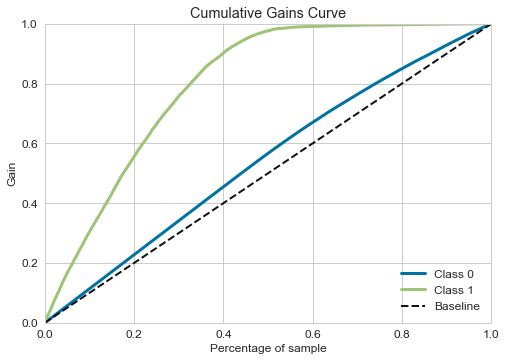

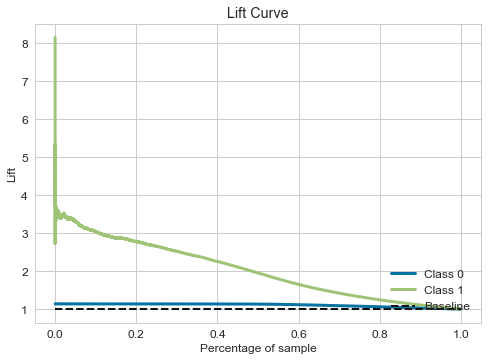

In [196]:
# fit model
lgbm_final = LGBMClassifier()

lgbm_final.fit(X_train, y_train)

# probabilities prediction
yhat_lgbm = lgbm_final.predict_proba(X_test)

# Cumulative Gain
plot_cumulative_gain(y_test, yhat_lgbm);

# Lift Curve
plot_lift_curve(y_test, yhat_lgbm);

# 9. Business Performance

1 - What percentage of customers interested in purchasing auto insurance will the sales team be able to contact by making 20,000 calls?

In [197]:
df1_test['response'].value_counts(normalize=True)

0   0.877432
1   0.122568
Name: response, dtype: float64

In [198]:
# answering the question
print(f'In the test dataset, 20.000 calls represents {round(100*20000 / len(df1_test),1)}%')

In the test dataset, 20.000 calls represents 21.0%


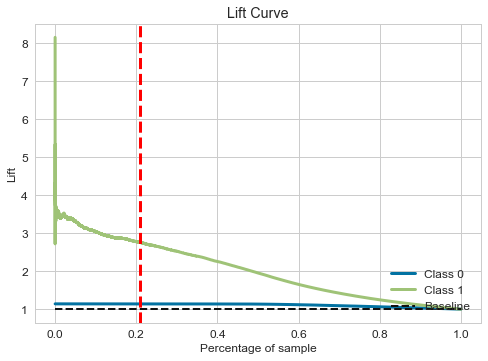

In [199]:
# using x_test as a reference
plot_lift_curve(y_test, yhat_lgbm)
plt.style.use('seaborn-whitegrid')
plt.axvline(0.21, 0, 1, color='red', ls='--', lw=3);

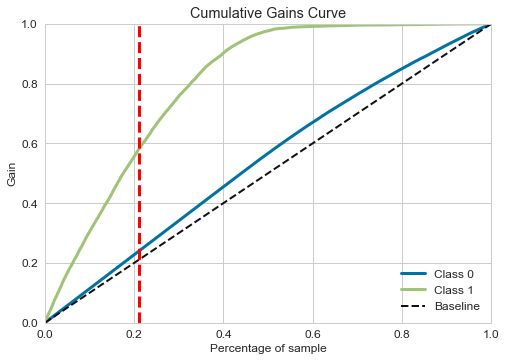

In [200]:
# using x_test as a reference
plot_cumulative_gain(y_test, yhat_lgbm)
plt.style.use('seaborn-whitegrid')
plt.axvline(0.21, 0, 1, color='red', ls='--', lw=3);

Of all clients in the test dataset, 12% are interested in the insurance.
By making 20,000 calls, the model can predict almost 3 times better than a random choice, meaning it can identify arount 57% of all interested clients

 2 - If the sales team's capacity increases to 40,000 calls, what percentage of customers interested in purchasing auto insurance will the sales team be able to contact?

In [201]:
# answering the question
print(f'In the test dataset, 20.000 calls represents {round(100*40000 / len(df1_test),1)}%')

In the test dataset, 20.000 calls represents 42.0%


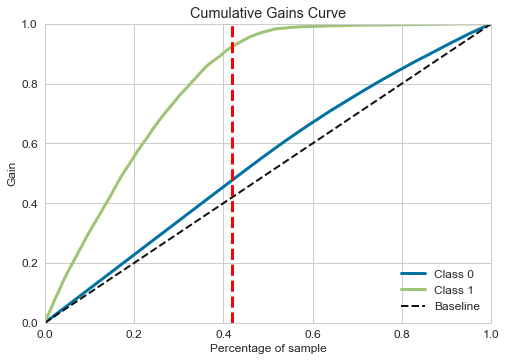

In [202]:
# using x_test as a reference
plot_cumulative_gain(y_test, yhat_lgbm)
plt.style.use('seaborn-whitegrid')
plt.axvline(0.42, 0, 1, color='red', ls='--', lw=3);

Of all clients in the test dataset, 12% are interested in the insurance. By making 40,000 calls, the model can predict almost 3 times better than a random choice, meaning it can identify arount 90% of all interested clients

4 - How many calls does the sales team need to make to contact 80% of customers interested in purchasing auto insurance?

In [335]:
# using x_test dataset as a reference
print(f'To contact 80% of interested customers, the sales team needs {round((80*len(df1_test) / 100))} calls')

To contact 80% of interested customers, the sales team needs 76222 calls


In [204]:
yproba=yhat_lgbm[:, 1]
ypred = lgbm_final.predict(X_test)


# add probablity and response columns
df_final['probability'] = yproba.copy()
df_final['response'] = ypred.copy()

In [205]:
X_test.head(10)

,premium_vintage,age_vintage,annual_premium,vintage,policy_sales_channel_Kfold_Target_Enc,region_code_Kfold_Target_Enc,age,vehicle_damage_num,gender,vehicle_age_1-2 Year,vehicle_age_plus 1 Year
11372,-0.242312,0.025183,0.274608,0.899654,0.196391,0.139280,0.800000,1,0,1,0
270751,-0.131621,0.008660,-0.215080,0.577855,0.028133,0.085624,0.061538,0,0,0,1
259048,0.203215,0.008274,0.618187,0.539792,0.028165,0.082141,0.030769,1,0,0,1
371764,-0.274228,0.010961,-0.930360,0.460208,0.028165,0.070899,0.030769,0,0,0,1
115985,-0.053933,0.056467,-0.899089,0.314879,0.195917,0.065863,0.492308,1,0,1,0
169264,-0.390721,0.003816,-0.557118,0.820069,0.028133,0.078947,0.061538,1,1,0,1
45134,-0.449950,0.002986,-0.653408,0.920415,0.028664,0.125413,0.076923,0,1,0,1
359952,0.300079,0.057540,-0.177916,0.335640,0.197449,0.190197,0.553846,0,0,1,0
122201,-0.261228,0.011423,0.212803,0.910035,0.200062,0.189951,0.353846,1,0,1,0
181554,-0.720006,0.026308,-1.944891,0.844291,0.211957,0.180693,0.769231,1,0,1,0


In [206]:
df_final.head(10)

,id_cust,gender,age,driving_license,previously_insured,annual_premium,vintage,vehicle_damage_num,age_class,vintage_class,annual_premium_bins,premium_vintage,insured_licence,age_vintage,region_code_Kfold_Target_Enc,policy_sales_channel_Kfold_Target_Enc,vehicle_age_1-2 Year,vehicle_age_plus 1 Year,vehicle_age_> 2 Years,probability,response
0,217180,0,0.200000,1,0,0.519084,0.121107,1,0,1.000000,1.000000,2.665918,0.000000,0.084008,0.187712,0.189634,0,1,0,0.137001,0
1,78127,0,0.384615,1,0,-1.944891,0.664360,1,1,3.000000,1.000000,-0.709582,0.000000,0.019650,0.103960,0.329060,1,0,0,0.002332,0
2,202836,1,0.307692,1,0,-1.944891,0.301038,1,1,2.000000,1.000000,-0.654466,0.000000,0.043549,0.189951,0.200062,1,0,0,0.098641,0
3,170179,0,0.369231,1,0,-0.043592,0.647059,1,1,3.000000,1.000000,-0.144627,0.000000,0.019722,0.124415,0.181818,1,0,0,0.002927,0
4,197363,0,0.200000,1,0,-0.664323,0.899654,1,0,4.000000,1.000000,-0.445410,0.000000,0.006975,0.106309,0.190745,0,1,0,0.218727,0
5,356942,0,0.338462,1,0,-1.944891,0.692042,1,1,3.000000,1.000000,-0.711522,0.000000,0.016779,0.078947,0.195906,1,0,0,0.080724,0
6,190537,1,0.153846,1,0,0.063412,0.013841,1,0,1.000000,1.000000,8.352085,0.000000,0.261684,0.127308,0.189818,0,1,0,0.002910,0
7,77738,0,0.600000,1,0,2.882617,0.636678,1,2,3.000000,1.000000,0.745821,0.000000,0.029904,0.189951,0.200062,0,0,1,0.020210,0
8,186896,0,0.200000,1,0,-0.107808,0.370242,1,0,2.000000,1.000000,0.244427,0.000000,0.027122,0.190197,0.190745,0,1,0,0.339863,0
9,279158,0,0.430769,1,0,0.485670,0.560554,1,1,3.000000,1.000000,0.124601,0.000000,0.026746,0.190197,0.197449,0,1,0,0.126244,0


In [207]:
# 10 first rows of dataset
df_final = df_final.sort_values('probability', ascending=False)
df_final = df_final.reset_index(drop=True)
df_final[['id_cust','response','probability']].head(10)

,id_cust,response,probability
0,111321,1,0.714217
1,321284,1,0.708817
2,23371,1,0.701598
3,86159,1,0.691799
4,365212,1,0.681614
5,198128,1,0.679361
6,342969,1,0.669383
7,195731,1,0.656126
8,87412,1,0.642007
9,255321,1,0.637664
